In [1]:
import scanpy as sc
import pandas as pd 
import numpy as np
from scipy.sparse import csr_matrix
import scipy.stats as stats
import matplotlib.pyplot as plt
import matplotlib as mpl
import warnings
from nero import Harmonia
import seaborn as sns
from matplotlib import cm
from matplotlib import colors
import scipy.spatial as spacial

In [2]:
import matplotlib.pyplot as plt

In [3]:
# merge clusters 
#adata.obs['louvain']=adata.obs['louvain'].where(adata.obs['louvain']!='CD14+ Mono2','CD14+ Mono')

# Make scanpy colors

In [4]:
vega_10 = list(map(colors.to_hex, cm.tab10.colors))
vega_10_scanpy = vega_10.copy()
vega_10_scanpy[2] = '#279e68'  # green
vega_10_scanpy[4] = '#aa40fc'  # purple
vega_10_scanpy[8] = '#b5bd61'  # kakhi

# default matplotlib 2.0 palette
# see 'category20' on https://github.com/vega/vega/wiki/Scales#scale-range-literals
vega_20 = list(map(colors.to_hex, cm.tab20.colors))
vega_20_scanpy = [
    *vega_20[0:14:2], *vega_20[16::2],  # dark without grey
    *vega_20[1:15:2], *vega_20[17::2],  # light without grey
    '#ad494a', '#8c6d31',  # manual additions
]
vega_20_scanpy[2] = vega_10_scanpy[2]
vega_20_scanpy[4] = vega_10_scanpy[4]
vega_20_scanpy[7] = vega_10_scanpy[8] 

In [5]:
vega_20_scanpy

['#1f77b4',
 '#ff7f0e',
 '#279e68',
 '#d62728',
 '#aa40fc',
 '#8c564b',
 '#e377c2',
 '#b5bd61',
 '#17becf',
 '#aec7e8',
 '#ffbb78',
 '#98df8a',
 '#ff9896',
 '#c5b0d5',
 '#c49c94',
 '#f7b6d2',
 '#dbdb8d',
 '#9edae5',
 '#ad494a',
 '#8c6d31']

In [6]:
# might need this, the most recent version of jupterlab I installed installed the most recent version of jedi which has been having problems with autocomplete
# see thread here: https://github.com/ipython/ipython/issues/10493
%config Completer.use_jedi = False

sc.settings.verbosity = 4
sc.settings.set_figure_params(dpi=80)

In [7]:
sc.set_figure_params(dpi_save=1000,figsize=[5,5])

# 200K loading data from R processed files

In [8]:
# import intermediate files R code from scitoseq.pbmc_final.R 
# currently we are working on streamlined processing of all analysis in python

meta_2_df = pd.read_table('./200K_meta_ab_cell_matrix.txt_for_david_0.99_cd45mean_negative',sep=',')
adt_2_df = pd.read_table('./200K_selected_ab_cell_matrix_for_david_0.99_cd45mean_negative.txt',sep=',')     


In [9]:
rescue_sng = pd.read_table('./200K_rescue_negative_singlet_bc.txt',sep=',')
rescue_mtp = pd.read_table('./200K_rescue_negative_multiplet_bc.txt',sep=',')   

In [10]:
adt_from_R_adata_2 = sc.AnnData(adt_2_df.T)
adt_from_R_adata_2.obs = meta_2_df
adt_from_R_adata_2.obs.loc[adt_from_R_adata_2.obs['DBC'].isin(rescue_sng['barcodes']), "Reclassify"]  = 1
adt_from_R_adata_2.obs.loc[adt_from_R_adata_2.obs['DBC'].isin(rescue_mtp['barcodes']), "Reclassify"]  = 2

In [11]:
#adt_from_R_adata_2.obs.Reclassify.dropna()

In [12]:
adt_from_R_adata_2 = adt_from_R_adata_2[(adt_from_R_adata_2.obs['Type']!='Negative')|(adt_from_R_adata_2.obs['Reclassify']==1.0)|(adt_from_R_adata_2.obs['Reclassify']==2.0)]

In [13]:
CD235_CD61 = adt_from_R_adata_2[:,'CD61-barcode1'].X +adt_from_R_adata_2[:,'CD235-barcode1'].X 

In [14]:
df = adt_from_R_adata_2.to_df()

In [15]:
df['CD235/CD61'] = df['CD235-barcode1'] + df['CD61-barcode1']

In [16]:
df = df.drop('CD235-barcode1', axis = 1)
df = df.drop('CD61-barcode1', axis = 1)

In [17]:
df

,CD45-barcode1,CD33-barcode1,CD3-barcode1,CD19-barcode1,CD117-barcode1,CD11b-barcode1,CD4-barcode1,Cd8a-barcode1,CD11c-barcode1,CD14-barcode1,...,CD27-barcode1,CD45RO-barcode1,CCR7-barcode1,CD25-barcode1,TCR-Va24-Ja18-barcode1,CD38-barcode1,HLA-DR-barcode1,PD-1-barcode1,CD56-barcode1,CD235/CD61
AAACCCAAGGCTCTAT.1,109.0,1.0,10.0,3.0,4.0,38.0,1.0,44.0,13.0,21.0,...,7.0,8.0,15.0,2.0,3.0,43.0,9.0,4.0,64.0,8.0
AAACCCACAAATCAGA.1,296.0,0.0,5.0,4.0,3.0,51.0,0.0,3.0,1.0,13.0,...,1.0,10.0,12.0,2.0,3.0,18.0,4.0,2.0,18.0,30.0
AAACCCACAACGGGTA.1,437.0,0.0,313.0,1.0,3.0,5.0,54.0,5.0,2.0,12.0,...,121.0,18.0,9.0,3.0,0.0,43.0,8.0,5.0,5.0,5.0
AAACCCACAGCACAGA.1,566.0,6.0,14.0,3.0,4.0,324.0,24.0,5.0,63.0,321.0,...,5.0,143.0,23.0,2.0,2.0,57.0,90.0,3.0,5.0,16.0
AAACCCACATGACAAA.1,420.0,0.0,257.0,3.0,1.0,7.0,59.0,250.0,1.0,6.0,...,110.0,579.0,12.0,2.0,0.0,3.0,7.0,0.0,6.0,6.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TTTGTTGGTCCACTTC.1.3,20.0,0.0,3.0,4.0,0.0,0.0,1.0,1.0,0.0,0.0,...,3.0,2.0,14.0,0.0,1.0,1.0,4.0,9.0,1.0,4.0
TTTGTTGTCCTTATGT.1,529.0,56.0,62.0,202.0,10.0,15.0,67.0,80.0,12.0,77.0,...,26.0,97.0,255.0,230.0,80.0,25.0,23.0,354.0,27.0,89.0
TTTGTTGTCGACACCG.1,694.0,0.0,0.0,4.0,0.0,6.0,0.0,6.0,1.0,5.0,...,2.0,0.0,10.0,2.0,0.0,6.0,1.0,3.0,0.0,1.0
TTTGTTGTCGTGCTCT.1.2,339.0,1.0,1.0,2.0,0.0,0.0,1.0,1.0,2.0,3.0,...,0.0,0.0,9.0,1.0,0.0,3.0,8.0,2.0,0.0,1.0


In [18]:
adata_2 = sc.AnnData(df)

In [19]:
adata_2.obs = adt_from_R_adata_2.obs

In [20]:
adata_2.obs

,orig.ident,nCount_RNA,nFeature_RNA,Batch,Type,Demuxlet,DBC,nCount_ADT,nFeature_ADT,Reclassify
AAACCCAAGGCTCTAT.1,SeuratProject,872,28,Batch1,Negative,donor1,AAACCCAAGGCTCTAT-1,872,28,2.0
AAACCCACAAATCAGA.1,SeuratProject,1083,24,Batch1,Negative,donor0,AAACCCACAAATCAGA-1,1083,24,1.0
AAACCCACAACGGGTA.1,SeuratProject,1460,25,Batch1,Doublet,donor1,AAACCCACAACGGGTA-1,1460,25,NaN
AAACCCACAGCACAGA.1,SeuratProject,1745,27,Batch1,Doublet,doublet,AAACCCACAGCACAGA-1,1745,27,NaN
AAACCCACATGACAAA.1,SeuratProject,1757,23,Batch1,Triplet,doublet,AAACCCACATGACAAA-1,1757,23,NaN
...,...,...,...,...,...,...,...,...,...,...
TTTGTTGGTCCACTTC.1.3,SeuratProject,86,20,Batch10,Quadruplet,doublet,TTTGTTGGTCCACTTC-1,86,20,NaN
TTTGTTGTCCTTATGT.1,SeuratProject,3242,28,Batch10,Singlet,donor1,TTTGTTGTCCTTATGT-1,3242,28,NaN
TTTGTTGTCGACACCG.1,SeuratProject,863,17,Batch10,Singlet,donor1,TTTGTTGTCGACACCG-1,863,17,NaN
TTTGTTGTCGTGCTCT.1.2,SeuratProject,423,20,Batch10,Triplet,donor1,TTTGTTGTCGTGCTCT-1,423,20,NaN


In [21]:
sc.pp.normalize_per_cell(adata_2, counts_per_cell_after=1e4)

normalizing by total count per cell


Trying to set attribute `.obs` of view, copying.


    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)


In [23]:
adata_2

AnnData object with n_obs × n_vars = 93127 × 27 
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'Batch', 'Type', 'Demuxlet', 'DBC', 'nCount_ADT', 'nFeature_ADT', 'Reclassify'

In [24]:
# per batch specific normalization here (code needs to be optimized here as well.. under optimization)

batch1 = adata_2[adata_2.obs['Batch']=='Batch1']
batch2 = adata_2[adata_2.obs['Batch']=='Batch2']
batch3 = adata_2[adata_2.obs['Batch']=='Batch3']
batch4 = adata_2[adata_2.obs['Batch']=='Batch4']
batch5 = adata_2[adata_2.obs['Batch']=='Batch5']
batch6 = adata_2[adata_2.obs['Batch']=='Batch6']
batch7 = adata_2[adata_2.obs['Batch']=='Batch7']
batch8 = adata_2[adata_2.obs['Batch']=='Batch8']
batch9 = adata_2[adata_2.obs['Batch']=='Batch9']
batch10 = adata_2[adata_2.obs['Batch']=='Batch10']

sc.pp.log1p(batch1)
sc.pp.log1p(batch2)
sc.pp.log1p(batch3)
sc.pp.log1p(batch4)
sc.pp.log1p(batch5)
sc.pp.log1p(batch6)
sc.pp.log1p(batch7)
sc.pp.log1p(batch8)
sc.pp.log1p(batch9)
sc.pp.log1p(batch10)

sc.pp.scale(batch1, max_value=10)
sc.pp.scale(batch2, max_value=10)
sc.pp.scale(batch3, max_value=10)
sc.pp.scale(batch4, max_value=10)
sc.pp.scale(batch5, max_value=10)
sc.pp.scale(batch6, max_value=10)
sc.pp.scale(batch7, max_value=10)
sc.pp.scale(batch8, max_value=10)
sc.pp.scale(batch9, max_value=10)
sc.pp.scale(batch10, max_value=10)

adata_2 = batch1.concatenate(batch2,batch3,batch4,batch5,batch6,batch7,batch8,batch9,batch10)

    ... clipping at max_value 10
    ... clipping at max_value 10
    ... clipping at max_value 10
    ... clipping at max_value 10
    ... clipping at max_value 10
    ... clipping at max_value 10
    ... clipping at max_value 10
    ... clipping at max_value 10
    ... clipping at max_value 10
    ... clipping at max_value 10


/home/bhwang1/anaconda3/lib/python3.7/site-packages/scanpy/preprocessing/_simple.py:298: UserWarning: Revieved a view of an AnnData. Making a copy.
  view_to_actual(data)


In [25]:
adata_2.var_names_make_unique()

In [26]:
ptn_names =pd.DataFrame(['CD45','CD33','CD3','CD19','CD117','CD11b','CD4','CD8a','CD11c','CD14','CD127', 'FCER1','CD123','gdTCR', 'CD45RA','TIM3','PD-L1','CD27','CD45RO','CCR7','CD25','TCR_Va24_Ja18','CD38', 'HLA_DR','PD-1','CD56','CD235/CD61'])

ptn_names.columns=['Antibody']
ptn_names = ptn_names.set_index('Antibody')

adata_2.var = ptn_names


computing PCA with n_comps = 50
    reducing number of computed PCs to 26 as dim of data is only 27
    finished (0:00:00)
    and added
    'X_pca', the PCA coordinates (adata.obs)
    'PC1', 'PC2', ..., the loadings (adata.var)
    'pca_variance', the variance / eigenvalues (adata.uns)
    'pca_variance_ratio', the variance ratio (adata.uns)


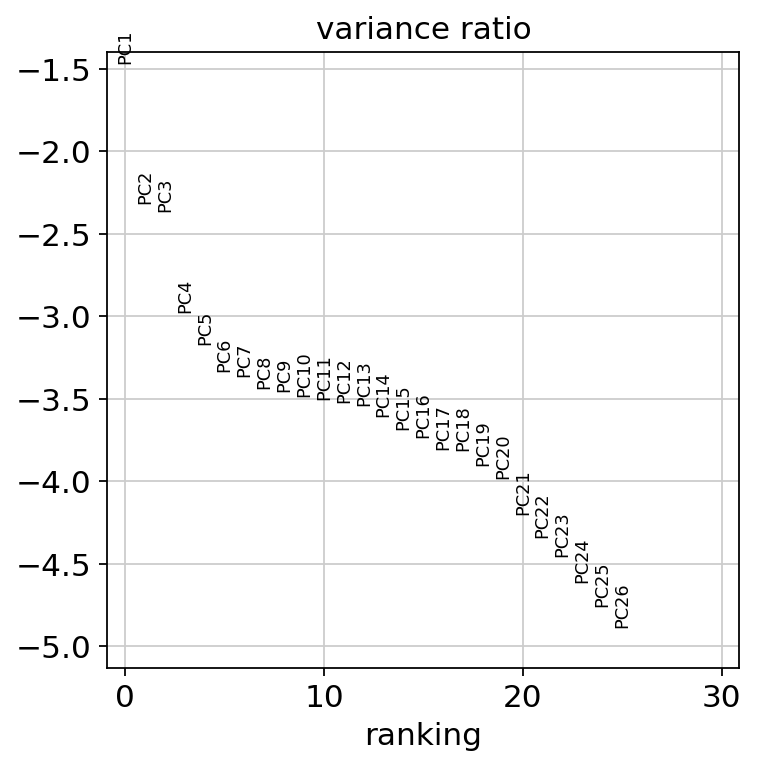

In [27]:
sc.tl.pca(adata_2, svd_solver='arpack', use_highly_variable=None)
sc.pl.pca_variance_ratio(adata_2, log=True)

# SUBSET FOR DEMUX SINGLETS

In [28]:
#adata_100k = per_batch_norm_from_R_adata[(per_batch_norm_from_R_adata.obs['Demuxlet']== 'donor0')|(per_batch_norm_from_R_adata.obs['Demuxlet']== 'donor1')]
adata_200k = adata_2[(adata_2.obs['Demuxlet']== 'donor0')|(adata_2.obs['Demuxlet']== 'donor1')]


In [29]:
adata_200k.var_names

Index(['CD45', 'CD33', 'CD3', 'CD19', 'CD117', 'CD11b', 'CD4', 'CD8a', 'CD11c',
       'CD14', 'CD127', 'FCER1', 'CD123', 'gdTCR', 'CD45RA', 'TIM3', 'PD-L1',
       'CD27', 'CD45RO', 'CCR7', 'CD25', 'TCR_Va24_Ja18', 'CD38', 'HLA_DR',
       'PD-1', 'CD56', 'CD235/CD61'],
      dtype='object', name='Antibody')

In [30]:
adata_2.obs['Demuxlet']

AAACCCAAGGCTCTAT.1-0       donor1
AAACCCACAAATCAGA.1-0       donor0
AAACCCACAACGGGTA.1-0       donor1
AAACCCACAGCACAGA.1-0      doublet
AAACCCACATGACAAA.1-0      doublet
                           ...   
TTTGTTGGTCCACTTC.1.3-9    doublet
TTTGTTGTCCTTATGT.1-9       donor1
TTTGTTGTCGACACCG.1-9       donor1
TTTGTTGTCGTGCTCT.1.2-9     donor1
TTTGTTGTCTGCTTTA.1-9       donor0
Name: Demuxlet, Length: 93127, dtype: object

In [31]:
#sc.tl.pca(adata_200k, svd_solver='arpack', use_highly_variable=None)
sc.pp.neighbors(adata_200k, n_neighbors=10, n_pcs=15)
sc.tl.umap(adata_200k)
sc.tl.leiden(adata_200k)

computing neighbors
    computing neighbors
    using data matrix X directly


/home/bhwang1/anaconda3/lib/python3.7/site-packages/numba/compiler.py:602: NumbaPerformanceWarning: 
The keyword argument 'parallel=True' was specified but no transformation for parallel execution was possible.

To find out why, try turning on parallel diagnostics, see http://numba.pydata.org/numba-doc/latest/user/parallel.html#diagnostics for help.

File "../../home/bhwang1/anaconda3/lib/python3.7/site-packages/umap/rp_tree.py", line 135:
@numba.njit(fastmath=True, nogil=True, parallel=True)
def euclidean_random_projection_split(data, indices, rng_state):
^

  self.func_ir.loc))
/home/bhwang1/anaconda3/lib/python3.7/site-packages/umap/nndescent.py:92: NumbaPerformanceWarning: 
The keyword argument 'parallel=True' was specified but no transformation for parallel execution was possible.

To find out why, try turning on parallel diagnostics, see http://numba.pydata.org/numba-doc/latest/user/parallel.html#diagnostics for help.

File "../../home/bhwang1/anaconda3/lib/python3.7/site-package

    computed neighbors (0:00:09)
    computed connectivities (0:00:03)
    finished: added to `.uns['neighbors']`
    'distances', distances for each pair of neighbors
    'connectivities', weighted adjacency matrix (0:00:13)
computing UMAP
	completed  0  /  200 epochs
	completed  20  /  200 epochs
	completed  40  /  200 epochs
	completed  60  /  200 epochs
	completed  80  /  200 epochs
	completed  100  /  200 epochs
	completed  120  /  200 epochs
	completed  140  /  200 epochs
	completed  160  /  200 epochs
	completed  180  /  200 epochs
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:34)
running Leiden clustering
    finished: found 19 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:21)


# without subsetting demuxlet singlets

In [58]:
sc.pp.neighbors(adata_2, n_neighbors=10, n_pcs=15)
sc.tl.umap(adata_2)
sc.tl.leiden(adata_2)

computing neighbors
    computing neighbors
    using data matrix X directly


/home/bhwang1/anaconda3/lib/python3.7/site-packages/numba/compiler.py:602: NumbaPerformanceWarning: 
The keyword argument 'parallel=True' was specified but no transformation for parallel execution was possible.

To find out why, try turning on parallel diagnostics, see http://numba.pydata.org/numba-doc/latest/user/parallel.html#diagnostics for help.

File "../../home/bhwang1/anaconda3/lib/python3.7/site-packages/umap/rp_tree.py", line 135:
@numba.njit(fastmath=True, nogil=True, parallel=True)
def euclidean_random_projection_split(data, indices, rng_state):
^

  self.func_ir.loc))
/home/bhwang1/anaconda3/lib/python3.7/site-packages/numba/compiler.py:602: NumbaPerformanceWarning: 
The keyword argument 'parallel=True' was specified but no transformation for parallel execution was possible.

To find out why, try turning on parallel diagnostics, see http://numba.pydata.org/numba-doc/latest/user/parallel.html#diagnostics for help.

File "../../home/bhwang1/anaconda3/lib/python3.7/site-packag

    computed neighbors (0:00:19)
    computed connectivities (0:00:02)
    finished: added to `.uns['neighbors']`
    'distances', distances for each pair of neighbors
    'connectivities', weighted adjacency matrix (0:00:21)
computing UMAP
	completed  0  /  200 epochs
	completed  20  /  200 epochs
	completed  40  /  200 epochs
	completed  60  /  200 epochs
	completed  80  /  200 epochs
	completed  100  /  200 epochs
	completed  120  /  200 epochs
	completed  140  /  200 epochs
	completed  160  /  200 epochs
	completed  180  /  200 epochs
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:01:25)
running Leiden clustering
    finished: found 21 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:01:04)


In [104]:
adata_200k

AnnData object with n_obs × n_vars = 40501 × 27 
    obs: 'Batch', 'DBC', 'Demuxlet', 'Reclassify', 'Type', 'batch', 'nCount_ADT', 'nCount_RNA', 'nFeature_ADT', 'nFeature_RNA', 'orig.ident', 'leiden'
    uns: 'pca', 'neighbors', 'umap', 'leiden'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'

... storing 'Batch' as categorical
... storing 'DBC' as categorical
... storing 'Demuxlet' as categorical
... storing 'Type' as categorical
... storing 'orig.ident' as categorical


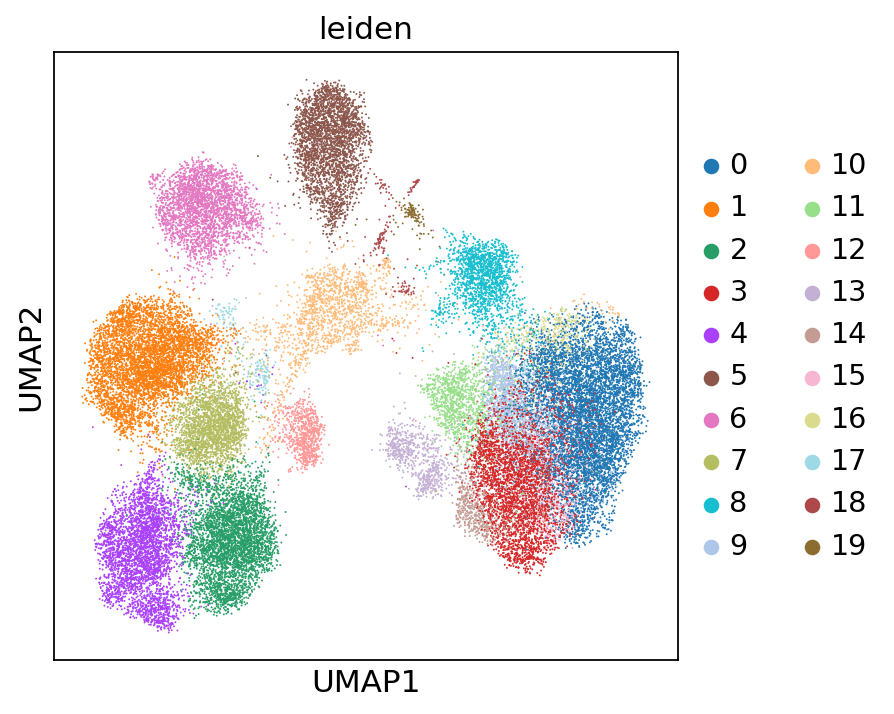

In [56]:
sc.pl.umap(adata_200k, color='leiden')

... storing 'Batch' as categorical
... storing 'DBC' as categorical
... storing 'Demuxlet' as categorical
... storing 'Type' as categorical
... storing 'orig.ident' as categorical


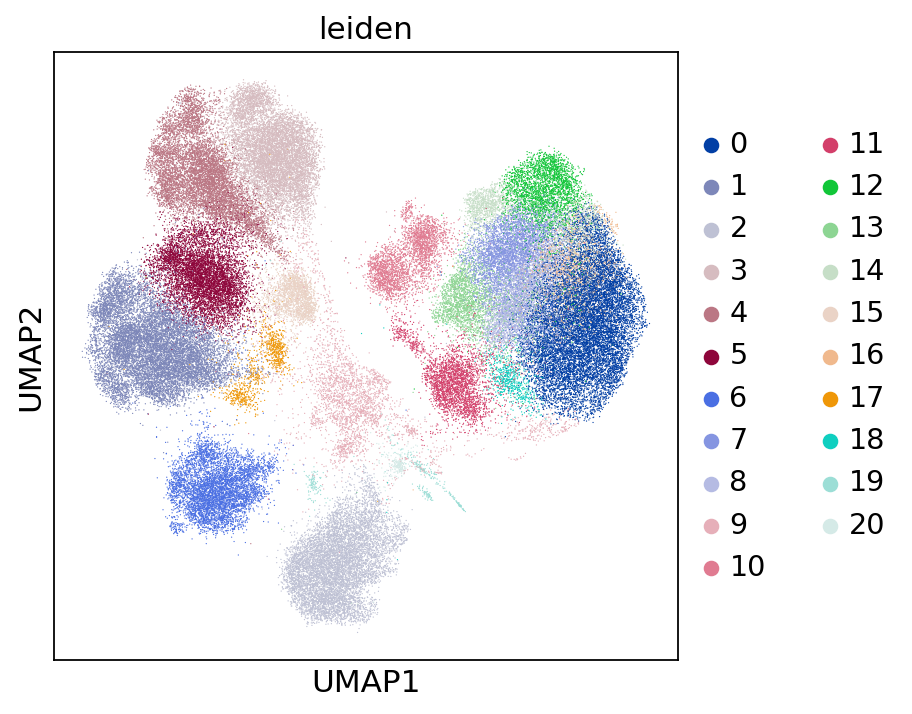

In [59]:
sc.pl.umap(adata_2, color='leiden')

# for stacked bar charts (scitoseq per donor but excluded collided cells)

In [32]:
adata_200k.obs.head()

,Batch,DBC,Demuxlet,Reclassify,Type,batch,nCount_ADT,nCount_RNA,nFeature_ADT,nFeature_RNA,orig.ident,leiden
AAACCCAAGGCTCTAT.1-0,Batch1,AAACCCAAGGCTCTAT-1,donor1,2.0,Negative,0,872,872,28,28,SeuratProject,5
AAACCCACAAATCAGA.1-0,Batch1,AAACCCACAAATCAGA-1,donor0,1.0,Negative,0,1083,1083,24,24,SeuratProject,5
AAACCCACAACGGGTA.1-0,Batch1,AAACCCACAACGGGTA-1,donor1,NaN,Doublet,0,1460,1460,25,25,SeuratProject,3
AAACCCATCTAGAACC.1-0,Batch1,AAACCCATCTAGAACC-1,donor1,NaN,Singlet,0,2375,2375,27,27,SeuratProject,15
AAACGAAGTACCACGC.1-0,Batch1,AAACGAAGTACCACGC-1,donor1,NaN,Triplet,0,1217,1217,26,26,SeuratProject,15


In [33]:
np.unique(adata_200k.obs['Type'])

array(['8', 'Doublet', 'Negative', 'Quadruplet', 'Quintuplet',
       'Septuplet', 'Sextuplet', 'Singlet', 'Triplet'], dtype=object)

In [34]:
batch_sng_d1_adata = adata_200k[((adata_200k.obs['Demuxlet']=='donor0')&(adata_200k.obs['Type']=='Singlet'))|((adata_200k.obs['Demuxlet']=='donor0')&(adata_200k.obs['Reclassify']==1.0))]
batch_dbl_d1_adata = adata_200k[((adata_200k.obs['Demuxlet']=='donor0')&(adata_200k.obs['Type']!='Singlet')&(adata_200k.obs['Type']!='Negative'))|((adata_200k.obs['Demuxlet']=='donor0')&(adata_200k.obs['Reclassify']==2.0))]

batch_db_d1_adata = adata_200k[((adata_200k.obs['Demuxlet']=='donor0')&(adata_200k.obs['Type']=='Doublet')&(adata_200k.obs['Type']!='Negative'))|((adata_200k.obs['Demuxlet']=='donor0')&(adata_200k.obs['Reclassify']==2.0))]
batch_tr_d1_adata = adata_200k[((adata_200k.obs['Demuxlet']=='donor0')&(adata_200k.obs['Type']=='Triplet')&(adata_200k.obs['Type']!='Negative'))|((adata_200k.obs['Demuxlet']=='donor0')&(adata_200k.obs['Reclassify']==2.0))]
batch_qu_d1_adata = adata_200k[((adata_200k.obs['Demuxlet']=='donor0')&(adata_200k.obs['Type']=='Quadruplet')&(adata_200k.obs['Type']!='Negative'))|((adata_200k.obs['Demuxlet']=='donor0')&(adata_200k.obs['Reclassify']==2.0))]
#batch_sng_d2_adata = adata_200k[adata_200k.obs['Demuxlet']=='donor1']

In [35]:
batch_sng_d2_adata = adata_200k[((adata_200k.obs['Demuxlet']=='donor1')&(adata_200k.obs['Type']=='Singlet'))|((adata_200k.obs['Demuxlet']=='donor1')&(adata_200k.obs['Reclassify']==1.0))]
batch_dbl_d2_adata = adata_200k[((adata_200k.obs['Demuxlet']=='donor1')&(adata_200k.obs['Type']!='Singlet')&(adata_200k.obs['Type']!='Negative'))|((adata_200k.obs['Demuxlet']=='donor1')&(adata_200k.obs['Reclassify']==2.0))]

batch_db_d2_adata = adata_200k[((adata_200k.obs['Demuxlet']=='donor1')&(adata_200k.obs['Type']=='Doublet')&(adata_200k.obs['Type']!='Negative'))|((adata_200k.obs['Demuxlet']=='donor0')&(adata_200k.obs['Reclassify']==2.0))]
batch_tr_d2_adata = adata_200k[((adata_200k.obs['Demuxlet']=='donor1')&(adata_200k.obs['Type']=='Triplet')&(adata_200k.obs['Type']!='Negative'))|((adata_200k.obs['Demuxlet']=='donor0')&(adata_200k.obs['Reclassify']==2.0))]
batch_qu_d2_adata = adata_200k[((adata_200k.obs['Demuxlet']=='donor1')&(adata_200k.obs['Type']=='Quadruplet')&(adata_200k.obs['Type']!='Negative'))|((adata_200k.obs['Demuxlet']=='donor0')&(adata_200k.obs['Reclassify']==2.0))]



In [57]:
# identify collision population based on UMAP
adata_200k[(adata_200k.obs['leiden']=='11')|(adata_200k.obs['leiden']=='17')].shape[0]/adata_200k.shape[0]

0.04350509863953977

In [36]:
sng_d1_list = []
#for x in range(0,19):
#    sng_d1_prop_list.append(batch_sng_d1_adata[(batch_sng_d1_adata.obs['leiden']==str(x))].shape[0]/batch_sng_d1_adata.shape[0])
for x in range(0,19):
    sng_d1_list.append(batch_sng_d1_adata[(batch_sng_d1_adata.obs['leiden']==str(x))].shape[0])

 #11,17 original   
#10, 15 new mtp/sng norm    
#10,16,19 demux subset earlier..
sng_d1_list.pop(11)
sng_d1_list.pop(17)


sum_sng_d1 = sum(sng_d1_list)
sng_d1_prop_list = [x / sum_sng_d1 for x in sng_d1_list]
sum(sng_d1_prop_list)

1.0

In [48]:
sng_d1_prop_list.pop(11)
sng_d1_prop_list.pop(17)

0.002386634844868735

In [37]:
dbl_d1_list = []
#for x in range(0,19):
  #  dbl_d1_prop_list.append(batch_dbl_d1_adata[(batch_dbl_d1_adata.obs['leiden']==str(x))].shape[0]/batch_dbl_d1_adata.shape[0])
for x in range(0,19):
    dbl_d1_list.append(batch_dbl_d1_adata[(batch_dbl_d1_adata.obs['leiden']==str(x))].shape[0])
    
dbl_d1_list.pop(11)
dbl_d1_list.pop(17)

sum_dbl_d1 = sum(dbl_d1_list)
dbl_d1_prop_list = [x / sum_dbl_d1 for x in dbl_d1_list]
sum(dbl_d1_prop_list)

1.0000000000000004

In [51]:
dbl_d1_prop_list.pop(11)
dbl_d1_prop_list.pop(17)

0.004785465163435801

In [52]:
len(dbl_d1_prop_list)

17

In [71]:
stats.pearsonr(sng_d1_prop_list,dbl_d1_prop_list)

(0.9231495132590426, 1.2867717779702805e-07)

# get specific multiplet (doublet triplet quadruplet..etc) proportions


In [38]:
######## for donor 1 ############

db_d1_list = []
#for x in range(0,19):
#    sng_d1_prop_list.append(batch_sng_d1_adata[(batch_sng_d1_adata.obs['leiden']==str(x))].shape[0]/batch_sng_d1_adata.shape[0])
for x in range(0,19):
    db_d1_list.append(batch_db_d1_adata[(batch_db_d1_adata.obs['leiden']==str(x))].shape[0])
    
db_d1_list.pop(11)
db_d1_list.pop(17)


sum_db_d1 = sum(db_d1_list)
db_d1_prop_list = [x / sum_db_d1 for x in db_d1_list]

tr_d1_list = []
#for x in range(0,19):
#    sng_d1_prop_list.append(batch_sng_d1_adata[(batch_sng_d1_adata.obs['leiden']==str(x))].shape[0]/batch_sng_d1_adata.shape[0])
for x in range(0,19):
    tr_d1_list.append(batch_tr_d1_adata[(batch_tr_d1_adata.obs['leiden']==str(x))].shape[0])
    
tr_d1_list.pop(11)
tr_d1_list.pop(17)

sum_tr_d1 = sum(tr_d1_list)
tr_d1_prop_list = [x / sum_tr_d1 for x in tr_d1_list]

qu_d1_list = []
#for x in range(0,19):
#    sng_d1_prop_list.append(batch_sng_d1_adata[(batch_sng_d1_adata.obs['leiden']==str(x))].shape[0]/batch_sng_d1_adata.shape[0])
for x in range(0,19):
    qu_d1_list.append(batch_qu_d1_adata[(batch_qu_d1_adata.obs['leiden']==str(x))].shape[0])
    
qu_d1_list.pop(11)
qu_d1_list.pop(17)

sum_qu_d1 = sum(qu_d1_list)
qu_d1_prop_list = [x / sum_qu_d1 for x in qu_d1_list]

In [39]:
######## for donor 2 ############

db_d2_list = []
#for x in range(0,19):
#    sng_d2_prop_list.append(batch_sng_d2_adata[(batch_sng_d2_adata.obs['leiden']==str(x))].shape[0]/batch_sng_d2_adata.shape[0])
for x in range(0,19):
    db_d2_list.append(batch_db_d2_adata[(batch_db_d2_adata.obs['leiden']==str(x))].shape[0])
    
db_d2_list.pop(11)
db_d2_list.pop(17)
sum_db_d2 = sum(db_d2_list)
db_d2_prop_list = [x / sum_db_d2 for x in db_d2_list]

tr_d2_list = []
#for x in range(0,19):
#    sng_d2_prop_list.append(batch_sng_d2_adata[(batch_sng_d2_adata.obs['leiden']==str(x))].shape[0]/batch_sng_d2_adata.shape[0])
for x in range(0,19):
    tr_d2_list.append(batch_tr_d2_adata[(batch_tr_d2_adata.obs['leiden']==str(x))].shape[0])
    
tr_d2_list.pop(11)
tr_d2_list.pop(17)
sum_tr_d2 = sum(tr_d2_list)
tr_d2_prop_list = [x / sum_tr_d2 for x in tr_d2_list]

qu_d2_list = []
#for x in range(0,19):
#    sng_d2_prop_list.append(batch_sng_d2_adata[(batch_sng_d2_adata.obs['leiden']==str(x))].shape[0]/batch_sng_d2_adata.shape[0])
for x in range(0,19):
    qu_d2_list.append(batch_qu_d2_adata[(batch_qu_d2_adata.obs['leiden']==str(x))].shape[0])
    
qu_d2_list.pop(11)
qu_d2_list.pop(17)
sum_qu_d2 = sum(qu_d2_list)
qu_d2_prop_list = [x / sum_qu_d2 for x in qu_d2_list]

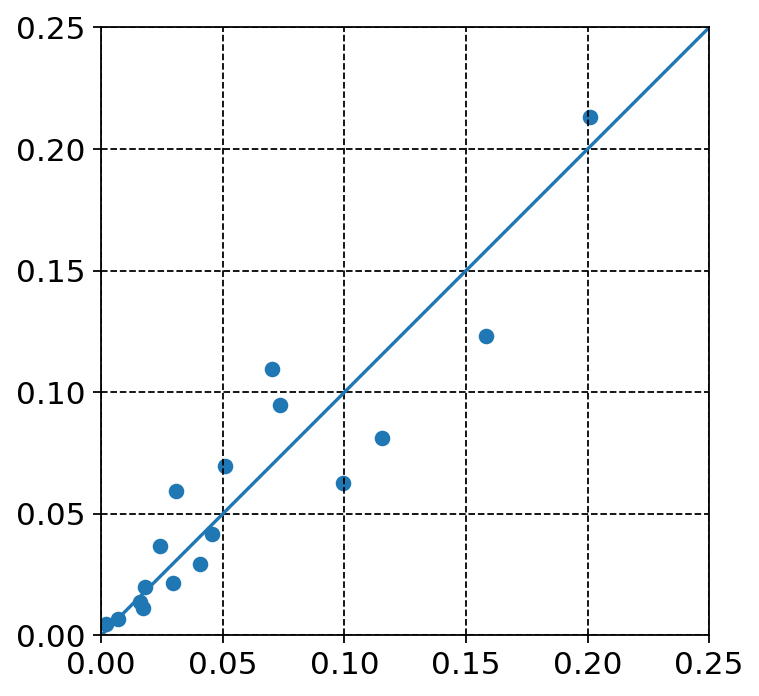

In [74]:
# subset earlier
fig = plt.figure()
ax = plt.subplot(111)
plt.scatter(sng_d1_prop_list,dbl_d1_prop_list)

ax.set_xlim((0,0.25))
ax.set_ylim((0,0.25))
x0,x1 = ax.get_xlim()
y0,y1 = ax.get_ylim()
ax.set_aspect(abs(x1-x0)/abs(y1-y0))
ax.grid(b=True, which='major', color='k', linestyle='--')
ident = [0.0, 1.0]
plt.plot(ident,ident)

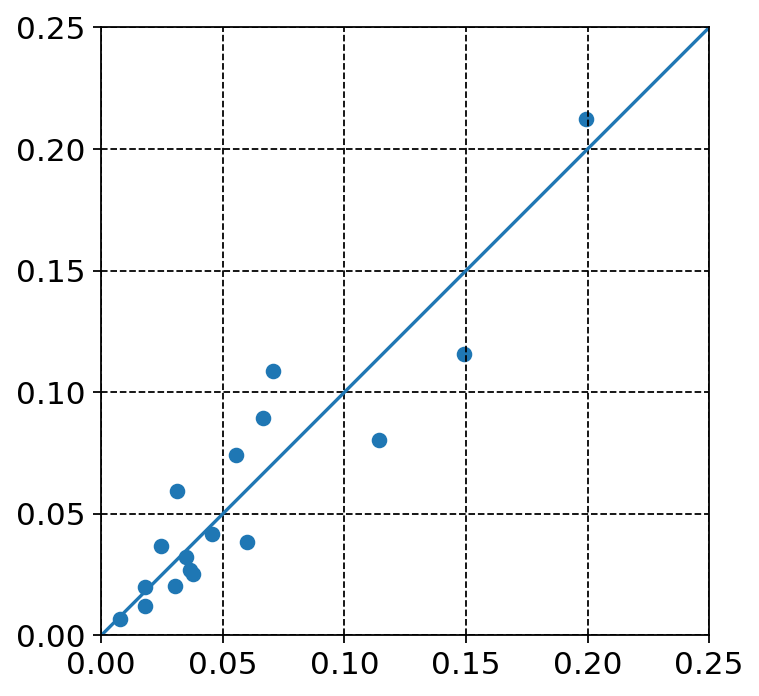

In [74]:
fig = plt.figure()
ax = plt.subplot(111)
plt.scatter(sng_d1_prop_list,dbl_d1_prop_list)

ax.set_xlim((0,0.25))
ax.set_ylim((0,0.25))
x0,x1 = ax.get_xlim()
y0,y1 = ax.get_ylim()
ax.set_aspect(abs(x1-x0)/abs(y1-y0))
ax.grid(b=True, which='major', color='k', linestyle='--')
ident = [0.0, 1.0]
plt.plot(ident,ident)

In [52]:
#sng_d2_prop_list = []
#for x in range(0,19):
  #  sng_d2_prop_list.append(batch_sng_d2_adata[(batch_sng_d2_adata.obs['leiden']==str(x))].shape[0]/batch_sng_d2_adata.shape[0])

#sng_d2_prop_list.pop(11)
#sng_d2_prop_list.pop(17)

#dbl_d2_prop_list = []
#for x in range(0,19):
 #   dbl_d2_prop_list.append(batch_dbl_d2_adata[(batch_dbl_d2_adata.obs['leiden']==str(x))].shape[0]/batch_dbl_d2_adata.shape[0])

#dbl_d2_prop_list.pop(11)
#dbl_d2_prop_list.pop(17)
sng_d2_list = []
#for x in range(0,19):
#    sng_d2_prop_list.append(batch_sng_d2_adata[(batch_sng_d2_adata.obs['leiden']==str(x))].shape[0]/batch_sng_d2_adata.shape[0])
for x in range(0,19):
    sng_d2_list.append(batch_sng_d2_adata[(batch_sng_d2_adata.obs['leiden']==str(x))].shape[0])
    
sng_d2_list.pop(11)
sng_d2_list.pop(17)


sum_sng_d2 = sum(sng_d2_list)
sng_d2_prop_list = [x / sum_sng_d2 for x in sng_d2_list]

dbl_d2_list = []
#for x in range(0,19):
  #  dbl_d2_prop_list.append(batch_dbl_d2_adata[(batch_dbl_d2_adata.obs['leiden']==str(x))].shape[0]/batch_dbl_d2_adata.shape[0])
for x in range(0,19):
    dbl_d2_list.append(batch_dbl_d2_adata[(batch_dbl_d2_adata.obs['leiden']==str(x))].shape[0])
    
dbl_d2_list.pop(11)
dbl_d2_list.pop(17)

sum_dbl_d2 = sum(dbl_d2_list)
dbl_d2_prop_list = [x / sum_dbl_d2 for x in dbl_d2_list]




In [73]:
stats.pearsonr(sng_d2_prop_list,dbl_d2_prop_list)

(0.9106345580294157, 9.611110999715742e-07)

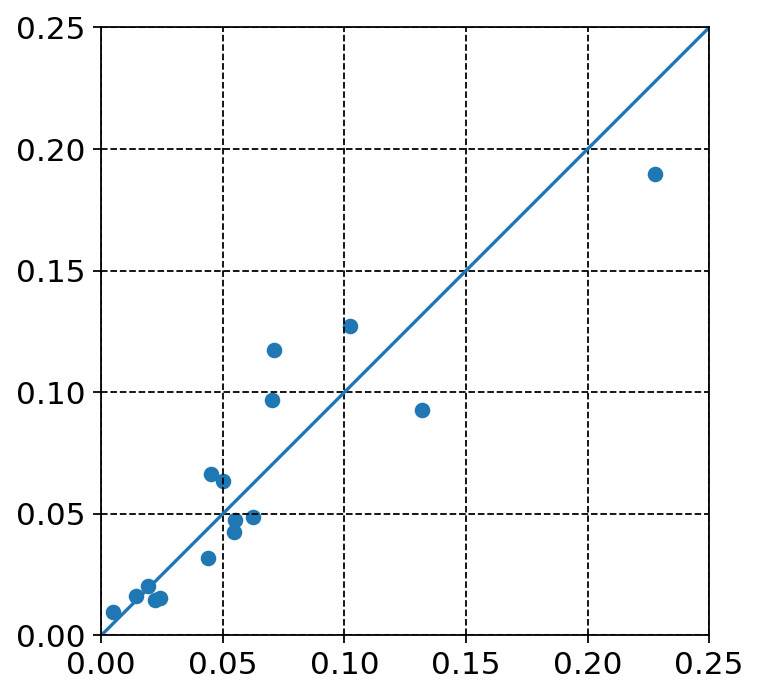

In [75]:
# subset earlier
fig = plt.figure()
ax = plt.subplot(111)
plt.scatter(sng_d2_prop_list,dbl_d2_prop_list)

ax.set_xlim((0,0.25))
ax.set_ylim((0,0.25))
x0,x1 = ax.get_xlim()
y0,y1 = ax.get_ylim()
ax.set_aspect(abs(x1-x0)/abs(y1-y0))
ax.grid(b=True, which='major', color='k', linestyle='--')
ident = [0.0, 1.0]
plt.plot(ident,ident)

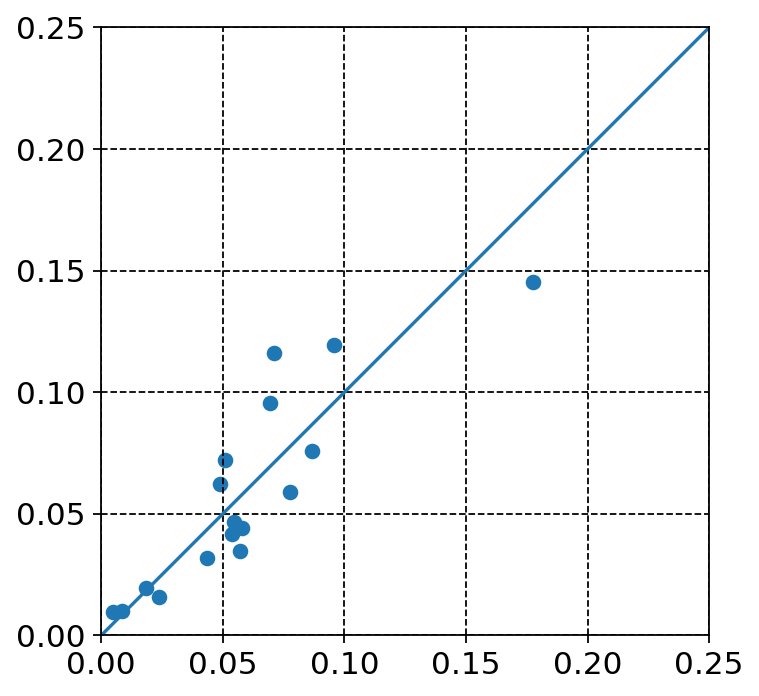

In [77]:
fig = plt.figure()
ax = plt.subplot(111)
plt.scatter(sng_d2_prop_list,dbl_d2_prop_list)

ax.set_xlim((0,0.25))
ax.set_ylim((0,0.25))
x0,x1 = ax.get_xlim()
y0,y1 = ax.get_ylim()
ax.set_aspect(abs(x1-x0)/abs(y1-y0))
ax.grid(b=True, which='major', color='k', linestyle='--')
ident = [0.0, 1.0]
plt.plot(ident,ident)

In [103]:
stats.pearsonr(tma_1_prop_list,dbl_d1_prop_list )

(0.9137373016355955, 2.9764731609979893e-07)

In [107]:
stats.pearsonr(tma_3_prop_list,dbl_d2_prop_list )

(0.9430256006899497, 1.4460870786459219e-08)

In [42]:
zeileis_28 = [
    "#023FA5", "#7D87B9", "#BEC1D4", "#D6BCC0", "#BB7784", "#8E063B", "#4A6FE3",
    "#8595E1", "#B5BBE3", "#E6AFB9", "#E07B91", "#D33F6A", "#11C638", "#8DD593",
    "#C6DEC7", "#EAD3C6", "#F0B98D", "#EF9708", "#0FCFC0", "#9CDED6", "#D5EAE7",
    "#F3E1EB", "#F6C4E1", "#F79CD4",
    '#7F7F7F', "#C7C7C7", "#1CE6FF", "#336600",  # these last ones were added,
]

In [53]:
# below proportion is from CyTOF proportions (matched leiden clusters)
# TMA1 vs donor1
# TMA2vs donor2
tma1 = [0.13215,0.17323,0.08776,0.11144,0.09263,0.1038,0.08097,0.07704,0.00827,0.03546,0.00958,0.00497,0.00051,0.01264,0.04588,0.01687,1.00E-05,0.0025,0.00429]
tma3=[0.18453, 0.06476, 0.13881, 0.11893, 0.18217, 0.05832, 0.06912, 0.05435, 0.01554, 0.03561, 0.01333, 0.00542, 0.00096, 0.02354, 0.01045, 0.01063, 1.00E-05, 0.00333, 0.01019]

tma1.pop(11)
tma1.pop(17)

sum_tma1 = sum(tma1)
tma_1_prop_list = [x / sum_tma1 for x in tma1]

tma3.pop(11)
tma3.pop(17)

sum_tma3 = sum(tma3)
tma_3_prop_list = [x / sum_tma3 for x in tma3]

# cosine similarity (final)


In [40]:
from sklearn.metrics.pairwise import cosine_similarity

In [54]:
#cosine_similarity(np.array(sng_d1_prop_list), np.array(db_d1_prop_list))
#all_prop = [sng_d1_prop_list, db_d1_prop_list,tr_d1_prop_list,qu_d1_prop_list]
all_prop = [sng_d2_prop_list, db_d2_prop_list,tr_d2_prop_list,qu_d2_prop_list]
# vectors
cos_all=[]
for i in range(0, len(all_prop)-1):
    for j in range(i+1, len(all_prop)):
        #print (i, j)
        a = np.array(all_prop[i])
        b = np.array(all_prop[j])

        # manually compute cosine similarity
        dot = np.dot(a, b)
        norma = np.linalg.norm(a)
        normb = np.linalg.norm(b)
        cos = dot / (norma * normb)
        cos_all.append(cos)
np.mean(cos_all)        

0.9695419154774485

In [56]:
cos_all=[]
d1_prop = [sng_d1_prop_list, db_d1_prop_list,tr_d1_prop_list,qu_d1_prop_list]
d2_prop = [sng_d2_prop_list, db_d2_prop_list,tr_d2_prop_list,qu_d2_prop_list]
# vectors
cos_all=[]
for i in range(0, len(d1_prop)):
    for j in range(0, len(d2_prop)):
        #print (i, j)
        a = np.array(d1_prop[i])
        b = np.array(d2_prop[j])

        # manually compute cosine similarity
        dot = np.dot(a, b)
        norma = np.linalg.norm(a)
        normb = np.linalg.norm(b)
        cos = dot / (norma * normb)
        cos_all.append(cos)
#len(cos_all)  
np.mean(cos_all)    

0.8356903492717467

In [59]:
#all_prop = [sng_d1_prop_list, db_d1_prop_list,tr_d1_prop_list,qu_d1_prop_list]
all_prop = [sng_d2_prop_list, db_d2_prop_list,tr_d2_prop_list,qu_d2_prop_list]
# vectors
cos_all=[]
for i in range(0, len(all_prop)):
        #print (i, j)
    a = np.array(all_prop[i])
    b = np.array(tma_3_prop_list)

    # manually compute cosine similarity
    dot = np.dot(a, b)
    norma = np.linalg.norm(a)
    normb = np.linalg.norm(b)
    cos = dot / (norma * normb)
    cos_all.append(cos)
np.mean(cos_all)      

0.9340498209578041

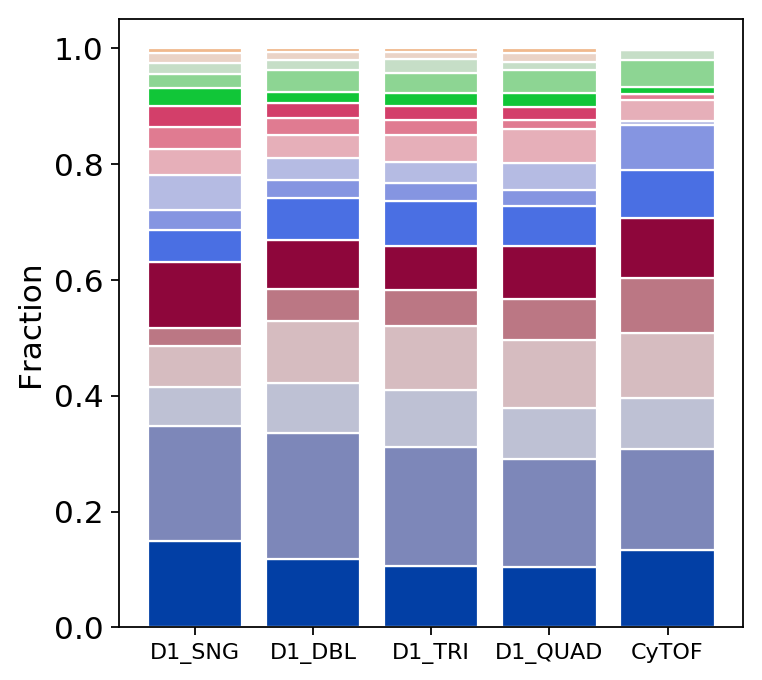

In [118]:
r = [0,1,2,3,4]
#raw_data = {'greenBars': [20, 1.5, 7, 10, 5], 'orangeBars': [5, 15, 5, 10, 15],'blueBars': [2, 15, 18, 5, 10]}
#df = pd.DataFrame(raw_data)
#my_cmap=cm.get_cmap('plasma', 50)
#print (my_cmap.colors)
# From raw value to percentage
#totals = [i+j+k for i,j,k in zip(df['greenBars'], df['orangeBars'], df['blueBars'])]
#greenBars = [i / j * 100 for i,j in zip(df['greenBars'], totals)]
#orangeBars = [i / j * 100 for i,j in zip(df['orangeBars'], totals)]
#blueBars = [i / j * 100 for i,j in zip(df['blueBars'], totals)]

a=[sng_d1_prop_list[0],db_d1_prop_list[0], tr_d1_prop_list[0], qu_d1_prop_list[0], tma_1_prop_list[0]]
b=[sng_d1_prop_list[1],db_d1_prop_list[1], tr_d1_prop_list[1], qu_d1_prop_list[1], tma_1_prop_list[1]]
c=[sng_d1_prop_list[2],db_d1_prop_list[2], tr_d1_prop_list[2], qu_d1_prop_list[2],tma_1_prop_list[2]]
d=[sng_d1_prop_list[3],db_d1_prop_list[3], tr_d1_prop_list[3], qu_d1_prop_list[3],tma_1_prop_list[3]]
e=[sng_d1_prop_list[4],db_d1_prop_list[4], tr_d1_prop_list[4], qu_d1_prop_list[4],tma_1_prop_list[4]]
f=[sng_d1_prop_list[5],db_d1_prop_list[5], tr_d1_prop_list[5], qu_d1_prop_list[5],tma_1_prop_list[5]]
g=[sng_d1_prop_list[6],db_d1_prop_list[6], tr_d1_prop_list[6], qu_d1_prop_list[6],tma_1_prop_list[6]]
h=[sng_d1_prop_list[7],db_d1_prop_list[7], tr_d1_prop_list[7], qu_d1_prop_list[7],tma_1_prop_list[7]]
i=[sng_d1_prop_list[8],db_d1_prop_list[8], tr_d1_prop_list[8], qu_d1_prop_list[8],tma_1_prop_list[8]]
j=[sng_d1_prop_list[9],db_d1_prop_list[9], tr_d1_prop_list[9], qu_d1_prop_list[9],tma_1_prop_list[9]]
k=[sng_d1_prop_list[10],db_d1_prop_list[10], tr_d1_prop_list[10], qu_d1_prop_list[10],tma_1_prop_list[10]]
l=[sng_d1_prop_list[11],db_d1_prop_list[11], tr_d1_prop_list[11], qu_d1_prop_list[11],tma_1_prop_list[11]]
m=[sng_d1_prop_list[12],db_d1_prop_list[12], tr_d1_prop_list[12], qu_d1_prop_list[12],tma_1_prop_list[12]]
n=[sng_d1_prop_list[13],db_d1_prop_list[13], tr_d1_prop_list[13], qu_d1_prop_list[13],tma_1_prop_list[13]]
o=[sng_d1_prop_list[14],db_d1_prop_list[14], tr_d1_prop_list[14], qu_d1_prop_list[14],tma_1_prop_list[14]]
p=[sng_d1_prop_list[15],db_d1_prop_list[15], tr_d1_prop_list[15], qu_d1_prop_list[15],tma_1_prop_list[15]]
q=[sng_d1_prop_list[16],db_d1_prop_list[16], tr_d1_prop_list[16], qu_d1_prop_list[16],tma_1_prop_list[16]]

# plot
barWidth = 0.80
names = ('D1_SNG','D1_DBL','D1_TRI','D1_QUAD', 'CyTOF')

plt.bar(r, a, color=zeileis_28[0], edgecolor='white', width=barWidth)
plt.bar(r, b, bottom=a, color=zeileis_28[1], edgecolor='white', width=barWidth)
plt.bar(r, c, bottom=np.array([a,b]).sum(axis=0), color=zeileis_28[2], edgecolor='white', width=barWidth)
plt.bar(r, d, bottom=np.array([a,b,c]).sum(axis=0), color=zeileis_28[3], edgecolor='white', width=barWidth)
plt.bar(r, e, bottom=np.array([a,b,c,d]).sum(axis=0), color=zeileis_28[4], edgecolor='white', width=barWidth)
plt.bar(r, f, bottom=np.array([a,b,c,d,e]).sum(axis=0), color=zeileis_28[5], edgecolor='white', width=barWidth)
plt.bar(r, g, bottom=np.array([a,b,c,d,e,f]).sum(axis=0), color=zeileis_28[6], edgecolor='white', width=barWidth)
plt.bar(r, h, bottom=np.array([a,b,c,d,e,f,g]).sum(axis=0), color=zeileis_28[7], edgecolor='white', width=barWidth)
plt.bar(r, i, bottom=np.array([a,b,c,d,e,f,g,h]).sum(axis=0), color=zeileis_28[8], edgecolor='white', width=barWidth)
plt.bar(r, j, bottom=np.array([a,b,c,d,e,f,g,h,i]).sum(axis=0), color=zeileis_28[9], edgecolor='white', width=barWidth)
plt.bar(r, k, bottom=np.array([a,b,c,d,e,f,g,h,i,j]).sum(axis=0), color=zeileis_28[10], edgecolor='white', width=barWidth)
plt.bar(r, l, bottom=np.array([a,b,c,d,e,f,g,h,i,j,k]).sum(axis=0), color=zeileis_28[11], edgecolor='white', width=barWidth)
plt.bar(r, m, bottom=np.array([a,b,c,d,e,f,g,h,i,j,k,l]).sum(axis=0), color=zeileis_28[12], edgecolor='white', width=barWidth)
plt.bar(r, n, bottom=np.array([a,b,c,d,e,f,g,h,i,j,k,l,m]).sum(axis=0), color=zeileis_28[13], edgecolor='white', width=barWidth)
plt.bar(r, o, bottom=np.array([a,b,c,d,e,f,g,h,i,j,k,l,m,n]).sum(axis=0), color=zeileis_28[14], edgecolor='white', width=barWidth)
plt.bar(r, p, bottom=np.array([a,b,c,d,e,f,g,h,i,j,k,l,m,n,o]).sum(axis=0), color=zeileis_28[15], edgecolor='white', width=barWidth)
plt.bar(r, q, bottom=np.array([a,b,c,d,e,f,g,h,i,j,k,l,m,n,o,p]).sum(axis=0), color=zeileis_28[16], edgecolor='white', width=barWidth)
 
# Custom x axis
plt.xticks(r, names, fontsize=10)
plt.ylabel("Fraction")
plt.grid(False)
# Show graphic
#plt.savefig("D1_fig3_stacked_barchart.png")
plt.show()
#plt.savefig("D1_fig3_stacked_barchart.png")

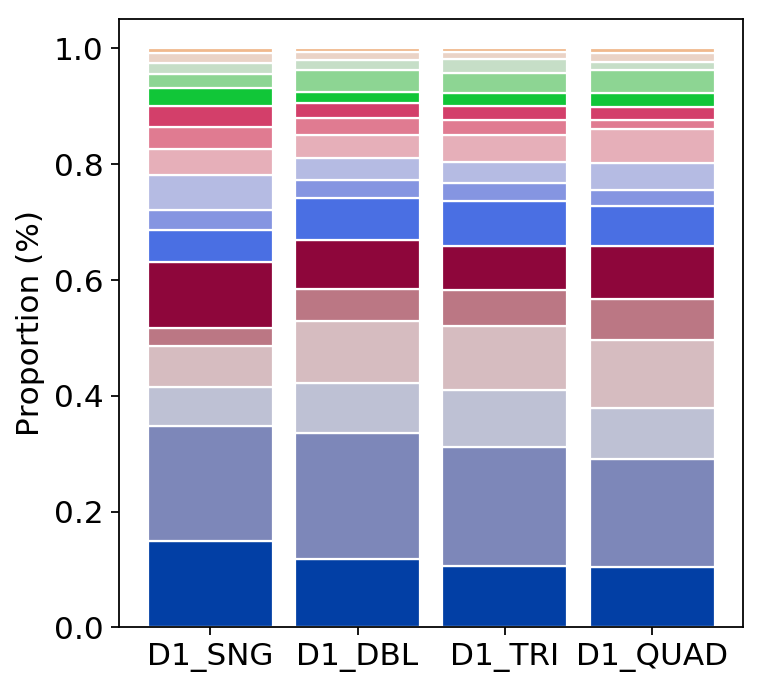

In [90]:
from matplotlib import rc
import matplotlib as mpl
import matplotlib.cm as cm
# Data
r = [0,1,2,3]
#raw_data = {'greenBars': [20, 1.5, 7, 10, 5], 'orangeBars': [5, 15, 5, 10, 15],'blueBars': [2, 15, 18, 5, 10]}
#df = pd.DataFrame(raw_data)
#my_cmap=cm.get_cmap('plasma', 50)
#print (my_cmap.colors)
# From raw value to percentage
#totals = [i+j+k for i,j,k in zip(df['greenBars'], df['orangeBars'], df['blueBars'])]
#greenBars = [i / j * 100 for i,j in zip(df['greenBars'], totals)]
#orangeBars = [i / j * 100 for i,j in zip(df['orangeBars'], totals)]
#blueBars = [i / j * 100 for i,j in zip(df['blueBars'], totals)]

a=[sng_d1_prop_list[0],db_d1_prop_list[0], tr_d1_prop_list[0], qu_d1_prop_list[0]]
b=[sng_d1_prop_list[1],db_d1_prop_list[1], tr_d1_prop_list[1], qu_d1_prop_list[1]]
c=[sng_d1_prop_list[2],db_d1_prop_list[2], tr_d1_prop_list[2], qu_d1_prop_list[2]]
d=[sng_d1_prop_list[3],db_d1_prop_list[3], tr_d1_prop_list[3], qu_d1_prop_list[3]]
e=[sng_d1_prop_list[4],db_d1_prop_list[4], tr_d1_prop_list[4], qu_d1_prop_list[4]]
f=[sng_d1_prop_list[5],db_d1_prop_list[5], tr_d1_prop_list[5], qu_d1_prop_list[5]]
g=[sng_d1_prop_list[6],db_d1_prop_list[6], tr_d1_prop_list[6], qu_d1_prop_list[6]]
h=[sng_d1_prop_list[7],db_d1_prop_list[7], tr_d1_prop_list[7], qu_d1_prop_list[7]]
i=[sng_d1_prop_list[8],db_d1_prop_list[8], tr_d1_prop_list[8], qu_d1_prop_list[8]]
j=[sng_d1_prop_list[9],db_d1_prop_list[9], tr_d1_prop_list[9], qu_d1_prop_list[9]]
k=[sng_d1_prop_list[10],db_d1_prop_list[10], tr_d1_prop_list[10], qu_d1_prop_list[10]]
l=[sng_d1_prop_list[11],db_d1_prop_list[11], tr_d1_prop_list[11], qu_d1_prop_list[11]]
m=[sng_d1_prop_list[12],db_d1_prop_list[12], tr_d1_prop_list[12], qu_d1_prop_list[12]]
n=[sng_d1_prop_list[13],db_d1_prop_list[13], tr_d1_prop_list[13], qu_d1_prop_list[13]]
o=[sng_d1_prop_list[14],db_d1_prop_list[14], tr_d1_prop_list[14], qu_d1_prop_list[14]]
p=[sng_d1_prop_list[15],db_d1_prop_list[15], tr_d1_prop_list[15], qu_d1_prop_list[15]]
q=[sng_d1_prop_list[16],db_d1_prop_list[16], tr_d1_prop_list[16], qu_d1_prop_list[16]]

# plot
barWidth = 0.85
names = ('D1_SNG','D1_DBL','D1_TRI','D1_QUAD')

plt.bar(r, a, color=zeileis_28[0], edgecolor='white', width=barWidth)
plt.bar(r, b, bottom=a, color=zeileis_28[1], edgecolor='white', width=barWidth)
plt.bar(r, c, bottom=np.array([a,b]).sum(axis=0), color=zeileis_28[2], edgecolor='white', width=barWidth)
plt.bar(r, d, bottom=np.array([a,b,c]).sum(axis=0), color=zeileis_28[3], edgecolor='white', width=barWidth)
plt.bar(r, e, bottom=np.array([a,b,c,d]).sum(axis=0), color=zeileis_28[4], edgecolor='white', width=barWidth)
plt.bar(r, f, bottom=np.array([a,b,c,d,e]).sum(axis=0), color=zeileis_28[5], edgecolor='white', width=barWidth)
plt.bar(r, g, bottom=np.array([a,b,c,d,e,f]).sum(axis=0), color=zeileis_28[6], edgecolor='white', width=barWidth)
plt.bar(r, h, bottom=np.array([a,b,c,d,e,f,g]).sum(axis=0), color=zeileis_28[7], edgecolor='white', width=barWidth)
plt.bar(r, i, bottom=np.array([a,b,c,d,e,f,g,h]).sum(axis=0), color=zeileis_28[8], edgecolor='white', width=barWidth)
plt.bar(r, j, bottom=np.array([a,b,c,d,e,f,g,h,i]).sum(axis=0), color=zeileis_28[9], edgecolor='white', width=barWidth)
plt.bar(r, k, bottom=np.array([a,b,c,d,e,f,g,h,i,j]).sum(axis=0), color=zeileis_28[10], edgecolor='white', width=barWidth)
plt.bar(r, l, bottom=np.array([a,b,c,d,e,f,g,h,i,j,k]).sum(axis=0), color=zeileis_28[11], edgecolor='white', width=barWidth)
plt.bar(r, m, bottom=np.array([a,b,c,d,e,f,g,h,i,j,k,l]).sum(axis=0), color=zeileis_28[12], edgecolor='white', width=barWidth)
plt.bar(r, n, bottom=np.array([a,b,c,d,e,f,g,h,i,j,k,l,m]).sum(axis=0), color=zeileis_28[13], edgecolor='white', width=barWidth)
plt.bar(r, o, bottom=np.array([a,b,c,d,e,f,g,h,i,j,k,l,m,n]).sum(axis=0), color=zeileis_28[14], edgecolor='white', width=barWidth)
plt.bar(r, p, bottom=np.array([a,b,c,d,e,f,g,h,i,j,k,l,m,n,o]).sum(axis=0), color=zeileis_28[15], edgecolor='white', width=barWidth)
plt.bar(r, q, bottom=np.array([a,b,c,d,e,f,g,h,i,j,k,l,m,n,o,p]).sum(axis=0), color=zeileis_28[16], edgecolor='white', width=barWidth)
 
# Custom x axis
plt.xticks(r, names)
plt.ylabel("Proportion (%)")
plt.grid(False)
# Show graphic
plt.show()

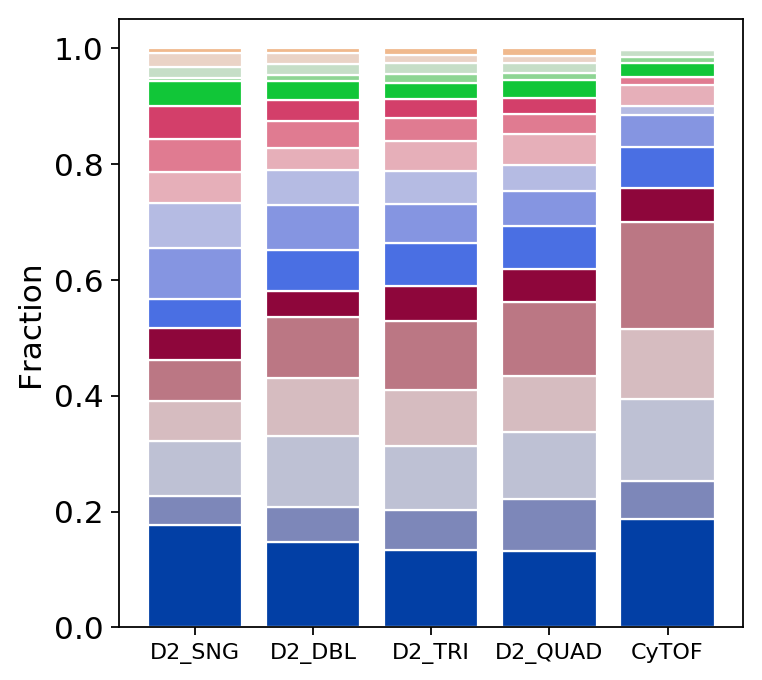

In [119]:
r = [0,1,2,3,4]
#raw_data = {'greenBars': [20, 1.5, 7, 10, 5], 'orangeBars': [5, 15, 5, 10, 15],'blueBars': [2, 15, 18, 5, 10]}
#df = pd.DataFrame(raw_data)
#my_cmap=cm.get_cmap('plasma', 50)
#print (my_cmap.colors)
# From raw value to percentage
#totals = [i+j+k for i,j,k in zip(df['greenBars'], df['orangeBars'], df['blueBars'])]
#greenBars = [i / j * 100 for i,j in zip(df['greenBars'], totals)]
#orangeBars = [i / j * 100 for i,j in zip(df['orangeBars'], totals)]
#blueBars = [i / j * 100 for i,j in zip(df['blueBars'], totals)]

a=[sng_d2_prop_list[0],db_d2_prop_list[0], tr_d2_prop_list[0], qu_d2_prop_list[0], tma_3_prop_list[0]]
b=[sng_d2_prop_list[1],db_d2_prop_list[1], tr_d2_prop_list[1], qu_d2_prop_list[1], tma_3_prop_list[1]]
c=[sng_d2_prop_list[2],db_d2_prop_list[2], tr_d2_prop_list[2], qu_d2_prop_list[2],tma_3_prop_list[2]]
d=[sng_d2_prop_list[3],db_d2_prop_list[3], tr_d2_prop_list[3], qu_d2_prop_list[3],tma_3_prop_list[3]]
e=[sng_d2_prop_list[4],db_d2_prop_list[4], tr_d2_prop_list[4], qu_d2_prop_list[4],tma_3_prop_list[4]]
f=[sng_d2_prop_list[5],db_d2_prop_list[5], tr_d2_prop_list[5], qu_d2_prop_list[5],tma_3_prop_list[5]]
g=[sng_d2_prop_list[6],db_d2_prop_list[6], tr_d2_prop_list[6], qu_d2_prop_list[6],tma_3_prop_list[6]]
h=[sng_d2_prop_list[7],db_d2_prop_list[7], tr_d2_prop_list[7], qu_d2_prop_list[7],tma_3_prop_list[7]]
i=[sng_d2_prop_list[8],db_d2_prop_list[8], tr_d2_prop_list[8], qu_d2_prop_list[8],tma_3_prop_list[8]]
j=[sng_d2_prop_list[9],db_d2_prop_list[9], tr_d2_prop_list[9], qu_d2_prop_list[9],tma_3_prop_list[9]]
k=[sng_d2_prop_list[10],db_d2_prop_list[10], tr_d2_prop_list[10], qu_d2_prop_list[10],tma_3_prop_list[10]]
l=[sng_d2_prop_list[11],db_d2_prop_list[11], tr_d2_prop_list[11], qu_d2_prop_list[11],tma_3_prop_list[11]]
m=[sng_d2_prop_list[12],db_d2_prop_list[12], tr_d2_prop_list[12], qu_d2_prop_list[12],tma_3_prop_list[12]]
n=[sng_d2_prop_list[13],db_d2_prop_list[13], tr_d2_prop_list[13], qu_d2_prop_list[13],tma_3_prop_list[13]]
o=[sng_d2_prop_list[14],db_d2_prop_list[14], tr_d2_prop_list[14], qu_d2_prop_list[14],tma_3_prop_list[14]]
p=[sng_d2_prop_list[15],db_d2_prop_list[15], tr_d2_prop_list[15], qu_d2_prop_list[15],tma_3_prop_list[15]]
q=[sng_d2_prop_list[16],db_d2_prop_list[16], tr_d2_prop_list[16], qu_d2_prop_list[16],tma_3_prop_list[16]]

# plot
barWidth = 0.80
names = ('D2_SNG','D2_DBL','D2_TRI','D2_QUAD', 'CyTOF')

plt.bar(r, a, color=zeileis_28[0], edgecolor='white', width=barWidth)
plt.bar(r, b, bottom=a, color=zeileis_28[1], edgecolor='white', width=barWidth)
plt.bar(r, c, bottom=np.array([a,b]).sum(axis=0), color=zeileis_28[2], edgecolor='white', width=barWidth)
plt.bar(r, d, bottom=np.array([a,b,c]).sum(axis=0), color=zeileis_28[3], edgecolor='white', width=barWidth)
plt.bar(r, e, bottom=np.array([a,b,c,d]).sum(axis=0), color=zeileis_28[4], edgecolor='white', width=barWidth)
plt.bar(r, f, bottom=np.array([a,b,c,d,e]).sum(axis=0), color=zeileis_28[5], edgecolor='white', width=barWidth)
plt.bar(r, g, bottom=np.array([a,b,c,d,e,f]).sum(axis=0), color=zeileis_28[6], edgecolor='white', width=barWidth)
plt.bar(r, h, bottom=np.array([a,b,c,d,e,f,g]).sum(axis=0), color=zeileis_28[7], edgecolor='white', width=barWidth)
plt.bar(r, i, bottom=np.array([a,b,c,d,e,f,g,h]).sum(axis=0), color=zeileis_28[8], edgecolor='white', width=barWidth)
plt.bar(r, j, bottom=np.array([a,b,c,d,e,f,g,h,i]).sum(axis=0), color=zeileis_28[9], edgecolor='white', width=barWidth)
plt.bar(r, k, bottom=np.array([a,b,c,d,e,f,g,h,i,j]).sum(axis=0), color=zeileis_28[10], edgecolor='white', width=barWidth)
plt.bar(r, l, bottom=np.array([a,b,c,d,e,f,g,h,i,j,k]).sum(axis=0), color=zeileis_28[11], edgecolor='white', width=barWidth)
plt.bar(r, m, bottom=np.array([a,b,c,d,e,f,g,h,i,j,k,l]).sum(axis=0), color=zeileis_28[12], edgecolor='white', width=barWidth)
plt.bar(r, n, bottom=np.array([a,b,c,d,e,f,g,h,i,j,k,l,m]).sum(axis=0), color=zeileis_28[13], edgecolor='white', width=barWidth)
plt.bar(r, o, bottom=np.array([a,b,c,d,e,f,g,h,i,j,k,l,m,n]).sum(axis=0), color=zeileis_28[14], edgecolor='white', width=barWidth)
plt.bar(r, p, bottom=np.array([a,b,c,d,e,f,g,h,i,j,k,l,m,n,o]).sum(axis=0), color=zeileis_28[15], edgecolor='white', width=barWidth)
plt.bar(r, q, bottom=np.array([a,b,c,d,e,f,g,h,i,j,k,l,m,n,o,p]).sum(axis=0), color=zeileis_28[16], edgecolor='white', width=barWidth)
 
# Custom x axis
plt.xticks(r, names, fontsize=10)
plt.ylabel("Fraction")
plt.grid(False)
# Show graphic
#plt.savefig("D2_fig3_stacked_barchart.png")
plt.show()
#plt.savefig("D2_fig3_stacked_barchart.png")

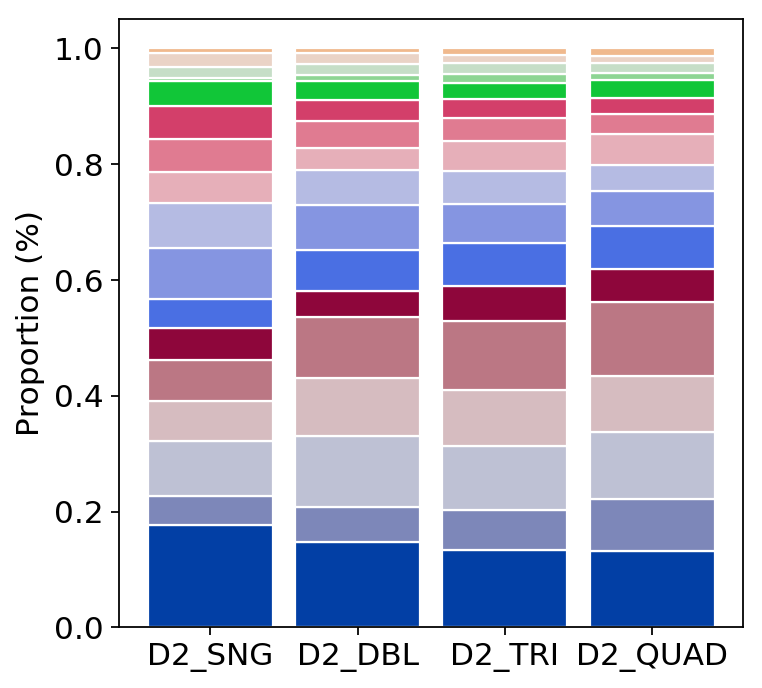

In [93]:
r = [0,1,2,3]
#raw_data = {'greenBars': [20, 1.5, 7, 10, 5], 'orangeBars': [5, 15, 5, 10, 15],'blueBars': [2, 15, 18, 5, 10]}
#df = pd.DataFrame(raw_data)
#my_cmap=cm.get_cmap('plasma', 50)
#print (my_cmap.colors)
# From raw value to percentage
#totals = [i+j+k for i,j,k in zip(df['greenBars'], df['orangeBars'], df['blueBars'])]
#greenBars = [i / j * 100 for i,j in zip(df['greenBars'], totals)]
#orangeBars = [i / j * 100 for i,j in zip(df['orangeBars'], totals)]
#blueBars = [i / j * 100 for i,j in zip(df['blueBars'], totals)]

a=[sng_d2_prop_list[0],db_d2_prop_list[0], tr_d2_prop_list[0], qu_d2_prop_list[0]]
b=[sng_d2_prop_list[1],db_d2_prop_list[1], tr_d2_prop_list[1], qu_d2_prop_list[1]]
c=[sng_d2_prop_list[2],db_d2_prop_list[2], tr_d2_prop_list[2], qu_d2_prop_list[2]]
d=[sng_d2_prop_list[3],db_d2_prop_list[3], tr_d2_prop_list[3], qu_d2_prop_list[3]]
e=[sng_d2_prop_list[4],db_d2_prop_list[4], tr_d2_prop_list[4], qu_d2_prop_list[4]]
f=[sng_d2_prop_list[5],db_d2_prop_list[5], tr_d2_prop_list[5], qu_d2_prop_list[5]]
g=[sng_d2_prop_list[6],db_d2_prop_list[6], tr_d2_prop_list[6], qu_d2_prop_list[6]]
h=[sng_d2_prop_list[7],db_d2_prop_list[7], tr_d2_prop_list[7], qu_d2_prop_list[7]]
i=[sng_d2_prop_list[8],db_d2_prop_list[8], tr_d2_prop_list[8], qu_d2_prop_list[8]]
j=[sng_d2_prop_list[9],db_d2_prop_list[9], tr_d2_prop_list[9], qu_d2_prop_list[9]]
k=[sng_d2_prop_list[10],db_d2_prop_list[10], tr_d2_prop_list[10], qu_d2_prop_list[10]]
l=[sng_d2_prop_list[11],db_d2_prop_list[11], tr_d2_prop_list[11], qu_d2_prop_list[11]]
m=[sng_d2_prop_list[12],db_d2_prop_list[12], tr_d2_prop_list[12], qu_d2_prop_list[12]]
n=[sng_d2_prop_list[13],db_d2_prop_list[13], tr_d2_prop_list[13], qu_d2_prop_list[13]]
o=[sng_d2_prop_list[14],db_d2_prop_list[14], tr_d2_prop_list[14], qu_d2_prop_list[14]]
p=[sng_d2_prop_list[15],db_d2_prop_list[15], tr_d2_prop_list[15], qu_d2_prop_list[15]]
q=[sng_d2_prop_list[16],db_d2_prop_list[16], tr_d2_prop_list[16], qu_d2_prop_list[16]]

# plot
barWidth = 0.85
names = ('D2_SNG','D2_DBL','D2_TRI','D2_QUAD')

plt.bar(r, a, color=zeileis_28[0], edgecolor='white', width=barWidth)
plt.bar(r, b, bottom=a, color=zeileis_28[1], edgecolor='white', width=barWidth)
plt.bar(r, c, bottom=np.array([a,b]).sum(axis=0), color=zeileis_28[2], edgecolor='white', width=barWidth)
plt.bar(r, d, bottom=np.array([a,b,c]).sum(axis=0), color=zeileis_28[3], edgecolor='white', width=barWidth)
plt.bar(r, e, bottom=np.array([a,b,c,d]).sum(axis=0), color=zeileis_28[4], edgecolor='white', width=barWidth)
plt.bar(r, f, bottom=np.array([a,b,c,d,e]).sum(axis=0), color=zeileis_28[5], edgecolor='white', width=barWidth)
plt.bar(r, g, bottom=np.array([a,b,c,d,e,f]).sum(axis=0), color=zeileis_28[6], edgecolor='white', width=barWidth)
plt.bar(r, h, bottom=np.array([a,b,c,d,e,f,g]).sum(axis=0), color=zeileis_28[7], edgecolor='white', width=barWidth)
plt.bar(r, i, bottom=np.array([a,b,c,d,e,f,g,h]).sum(axis=0), color=zeileis_28[8], edgecolor='white', width=barWidth)
plt.bar(r, j, bottom=np.array([a,b,c,d,e,f,g,h,i]).sum(axis=0), color=zeileis_28[9], edgecolor='white', width=barWidth)
plt.bar(r, k, bottom=np.array([a,b,c,d,e,f,g,h,i,j]).sum(axis=0), color=zeileis_28[10], edgecolor='white', width=barWidth)
plt.bar(r, l, bottom=np.array([a,b,c,d,e,f,g,h,i,j,k]).sum(axis=0), color=zeileis_28[11], edgecolor='white', width=barWidth)
plt.bar(r, m, bottom=np.array([a,b,c,d,e,f,g,h,i,j,k,l]).sum(axis=0), color=zeileis_28[12], edgecolor='white', width=barWidth)
plt.bar(r, n, bottom=np.array([a,b,c,d,e,f,g,h,i,j,k,l,m]).sum(axis=0), color=zeileis_28[13], edgecolor='white', width=barWidth)
plt.bar(r, o, bottom=np.array([a,b,c,d,e,f,g,h,i,j,k,l,m,n]).sum(axis=0), color=zeileis_28[14], edgecolor='white', width=barWidth)
plt.bar(r, p, bottom=np.array([a,b,c,d,e,f,g,h,i,j,k,l,m,n,o]).sum(axis=0), color=zeileis_28[15], edgecolor='white', width=barWidth)
plt.bar(r, q, bottom=np.array([a,b,c,d,e,f,g,h,i,j,k,l,m,n,o,p]).sum(axis=0), color=zeileis_28[16], edgecolor='white', width=barWidth)
 
# Custom x axis
plt.xticks(r, names)
plt.ylabel("Proportion (%)")
plt.grid(False)
# Show graphic
plt.show()

# heatmap for  d1_sng, d1_dbl, d1_tri, d1_quad, d1_cytof, d2_sng, d2_dbl,d2_tri,d2_quad,d2_cytof

In [154]:
a=np.array(sng_d1_prop_list)
b=np.array(db_d1_prop_list)
c=np.array(tr_d1_prop_list)
d=np.array(qu_d1_prop_list)
e=np.array(tma_1_prop_list)
f=np.array(sng_d2_prop_list)
g=np.array(db_d2_prop_list)
h=np.array(tr_d2_prop_list)
i=np.array(qu_d2_prop_list)
j=np.array(tma_3_prop_list)

input_heatmap= np.row_stack((a,b,c,d,e,f,g,h,i,j))
#input_heatmap = np.array([sng_d1_prop_list,db_d1_prop_list,tr_d1_prop_list, qu_d1_prop_list,tma_1_prop_list,sng_d2_prop_list,db_d2_prop_list,tr_d2_prop_list,qu_d2_prop_list,tma_3_prop_list ])

#input_heatmap = np.array(input_heatmap)
#input_heatmap

<Figure size 400x400 with 0 Axes>

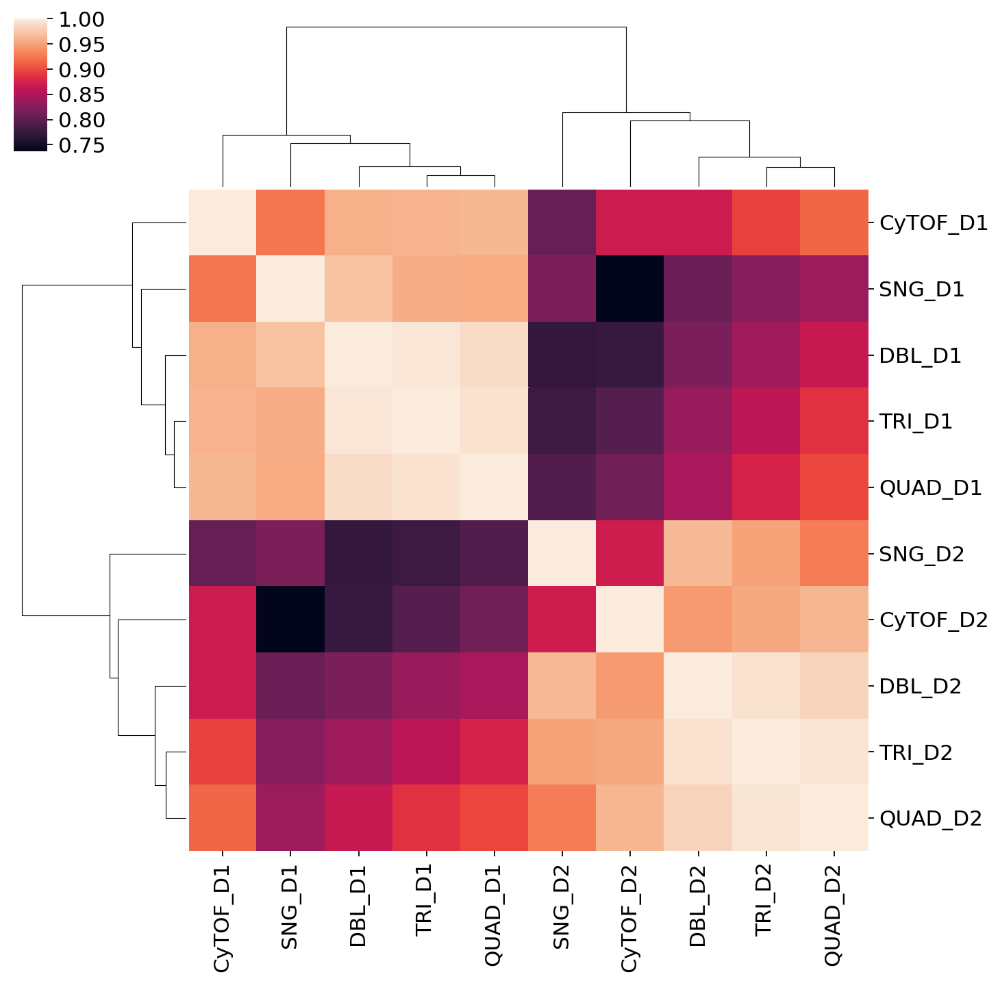

In [163]:
sc.set_figure_params(dpi_save=1000,figsize=[5,5])
import scipy
from scipy.spatial import distance
labels = ['SNG_D1','DBL_D1','TRI_D1','QUAD_D1', 'CyTOF_D1', 'SNG_D2','DBL_D2','TRI_D2','QUAD_D2', 'CyTOF_D2']
# columns=cytof_labels_cell_type_labels, index=seq_data_200k.index.values
distance_matrix = scipy.spatial.distance.cdist(input_heatmap, input_heatmap, 'cosine')
distance_matrix_df = pd.DataFrame(distance_matrix, columns=labels, index = labels)
plt.figure(figsize=(5, 5))
sns.clustermap(-(distance_matrix_df-1))

plt.savefig("D1_2_fig3_pairwise_dist_heatmap.png", bbox_inches = 'tight')

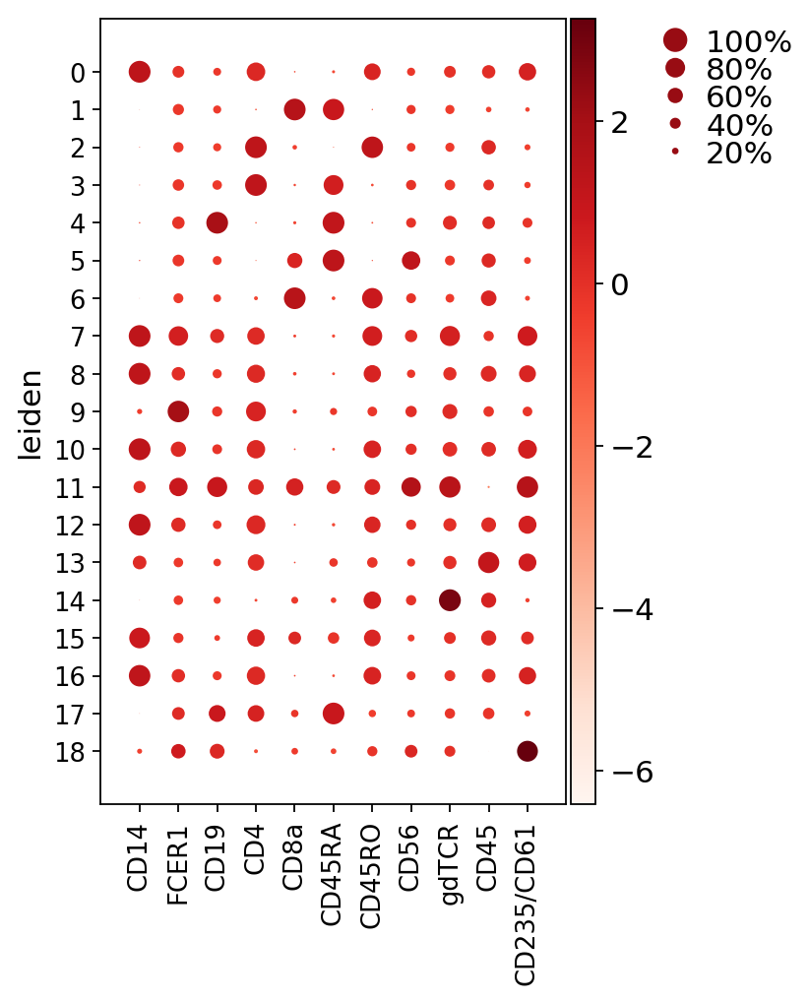

GridSpec(2, 5, height_ratios=[0, 10.5], width_ratios=[3.8499999999999996, 0, 0.2, 0.5, 0.25])

In [39]:
sc.pl.dotplot(adata_200k, groupby = 'leiden', var_names = ['CD14', 'FCER1','CD19','CD4','CD8a', 'CD45RA','CD45RO','CD56','gdTCR','CD45','CD235/CD61'])


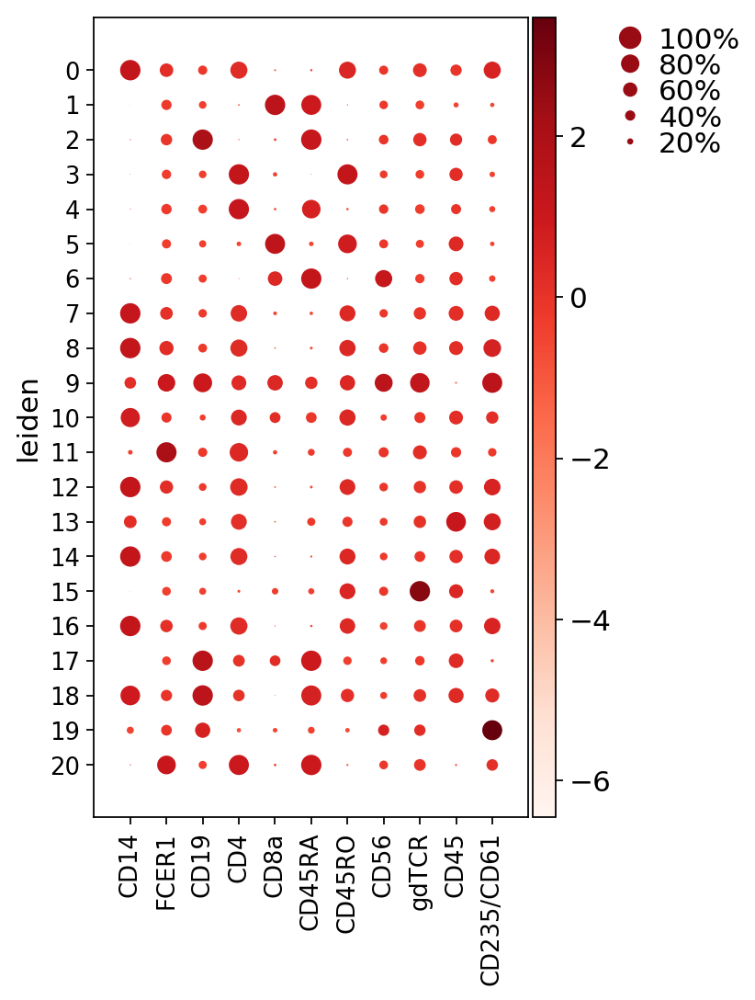

GridSpec(2, 5, height_ratios=[0, 10.5], width_ratios=[3.8499999999999996, 0, 0.2, 0.5, 0.25])

In [60]:
sc.pl.dotplot(adata_2, groupby = 'leiden', var_names = ['CD14', 'FCER1','CD19','CD4','CD8a', 'CD45RA','CD45RO','CD56','gdTCR','CD45','CD235/CD61'])

In [36]:
adata_200k.var_names

Index(['CD45', 'CD33', 'CD3', 'CD19', 'CD117', 'CD11b', 'CD4', 'CD8a', 'CD11c',
       'CD14', 'CD127', 'FCER1', 'CD123', 'gdTCR', 'CD45RA', 'TIM3', 'PD-L1',
       'CD27', 'CD45RO', 'CCR7', 'CD25', 'TCR_Va24_Ja18', 'CD38', 'HLA_DR',
       'PD-1', 'CD56', 'CD235/CD61'],
      dtype='object', name='Antibody')

# compare with cytof result using ingest function

In [37]:
cytof_z_score = pd.read_table('./Zscore_cytof_per_cell_3_12_2020.txt')

In [38]:
cell_id_c = [cytof_z_score['donor'],cytof_z_score['cell id'] , cytof_z_score['x']]

In [41]:
cell_id_df = pd.DataFrame(cell_id_c)

In [42]:
cell_id_df.T

,donor,cell id,x
0,TMA-001,124022,1
1,TMA-001,235546,1
2,TMA-001,15180,1
3,TMA-001,157582,1
4,TMA-001,154266,1
...,...,...,...
199995,TMA-003,111062,26
199996,TMA-003,183803,26
199997,TMA-003,168098,26
199998,TMA-003,217888,26


In [223]:
cytof_z_score = cytof_z_score.drop('donor', axis = 1)
cytof_z_score = cytof_z_score.drop('cell id', axis = 1)
cytof_z_score = cytof_z_score.drop('x', axis = 1)

In [224]:
cytof_z_score

,CD45,CD33,CD3,CD19,CD117,CD11b,CD4,CD8a,CD11c,CD14,...,CD27,CD45RO,CCR7,CD25,TCR_Va24_Ja18,CD38,HLA_DR,PD-1,CD56,CD235/CD61
0,1.518061,-0.511175,2.786832,1.279627,-0.580051,0.951000,-0.665945,1.521181,-0.904139,0.095435,...,1.515904,1.683778,1.165962,-0.447896,-0.294692,-0.096241,0.756996,0.613775,1.757313,-0.557733
1,-0.705616,-0.511175,-0.339845,-0.785003,-0.580051,-1.083075,-1.179005,-1.312934,-0.904139,-0.881468,...,1.083956,-1.158481,0.181789,-0.447896,-0.294692,-0.088894,-1.210311,-0.497070,-0.684309,0.510247
2,0.697919,-0.511175,1.440142,-0.785003,-0.580051,0.298698,-1.179005,-1.312934,-0.122071,-0.881468,...,0.413166,0.639109,-0.933540,-0.447896,-0.294692,-0.054778,0.134672,-0.497070,-0.684309,-0.557733
3,0.709412,2.881535,1.779087,-0.785003,2.253712,0.831654,-1.179005,0.486113,0.282967,-0.881468,...,-1.045541,1.249420,-0.933540,-0.447896,-0.294692,-0.411565,-1.210311,0.168949,-0.684309,-0.557733
4,-0.512336,2.854511,1.122034,-0.785003,-0.580051,-1.083075,-1.179005,-1.312934,-0.904139,-0.881468,...,1.008060,-1.158481,-0.933540,-0.447896,-0.294692,-1.666866,0.274632,-0.198045,0.814243,-0.557733
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
199995,0.083966,-0.511175,-0.848443,1.648534,-0.580051,-1.083075,-1.179005,0.194932,-0.904139,-0.881468,...,-0.811779,-1.158481,1.589442,-0.447896,-0.294692,0.508997,1.679986,-0.497070,-0.684309,-0.557733
199996,-0.030424,-0.511175,0.176792,1.451773,1.276455,-1.083075,-1.179005,-1.312934,-0.904139,-0.133447,...,-1.045541,-1.158481,1.958974,-0.447896,-0.294692,0.542707,1.700979,-0.497070,-0.684309,-0.557733
199997,-0.386642,-0.511175,3.227876,1.650838,-0.580051,-0.318193,-1.179005,0.563482,-0.904139,-0.881468,...,-0.358851,-1.158481,2.007700,-0.447896,-0.294692,0.187929,1.439585,-0.497070,-0.684309,-0.557733
199998,0.207324,-0.511175,-0.899691,1.971380,0.906577,-1.083075,-1.179005,-1.312934,-0.904139,-0.145713,...,-1.045541,-1.158481,1.441779,-0.447896,-0.294692,0.261369,1.450024,-0.497070,-0.684309,-0.557733


In [225]:
cytof = sc.AnnData(cytof_z_score)
cytof.obs = cell_id_df.T

Transforming to str index.


In [226]:
sc.tl.pca(cytof, svd_solver='arpack', use_highly_variable=None)
sc.pp.neighbors(cytof, n_neighbors=10, n_pcs=15)
sc.tl.umap(cytof)
sc.tl.leiden(cytof)

computing PCA with n_comps = 50
    reducing number of computed PCs to 26 as dim of data is only 27
    finished (0:00:00)
    and added
    'X_pca', the PCA coordinates (adata.obs)
    'PC1', 'PC2', ..., the loadings (adata.var)
    'pca_variance', the variance / eigenvalues (adata.uns)
    'pca_variance_ratio', the variance ratio (adata.uns)
computing neighbors
    computing neighbors
    using data matrix X directly


/wynton/home/ye/davidslee/anaconda3/lib/python3.7/site-packages/numba/compiler.py:602: NumbaPerformanceWarning: 
The keyword argument 'parallel=True' was specified but no transformation for parallel execution was possible.

To find out why, try turning on parallel diagnostics, see http://numba.pydata.org/numba-doc/latest/user/parallel.html#diagnostics for help.

File "../../../../../home/ye/davidslee/anaconda3/lib/python3.7/site-packages/umap/nndescent.py", line 47:
    @numba.njit(parallel=True)
    def nn_descent(
    ^

  self.func_ir.loc))


    computed neighbors (0:00:39)
    computed connectivities (0:00:04)
    finished: added to `.uns['neighbors']`
    'distances', distances for each pair of neighbors
    'connectivities', weighted adjacency matrix (0:00:44)
computing UMAP


/wynton/home/ye/davidslee/anaconda3/lib/python3.7/site-packages/umap/spectral.py:229: UserWarning: Embedding a total of 2 separate connected components using meta-embedding (experimental)
  n_components


	completed  0  /  200 epochs
	completed  20  /  200 epochs
	completed  40  /  200 epochs
	completed  60  /  200 epochs
	completed  80  /  200 epochs
	completed  100  /  200 epochs
	completed  120  /  200 epochs
	completed  140  /  200 epochs
	completed  160  /  200 epochs
	completed  180  /  200 epochs
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:03:58)
running Leiden clustering
    finished: found 33 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:02:12)


In [358]:
sc.tl.ingest(cytof, adata_200k, obs ='leiden')

running ingest


/wynton/home/ye/davidslee/anaconda3/lib/python3.7/site-packages/numba/compiler.py:602: NumbaPerformanceWarning: 
The keyword argument 'parallel=True' was specified but no transformation for parallel execution was possible.

To find out why, try turning on parallel diagnostics, see http://numba.pydata.org/numba-doc/latest/user/parallel.html#diagnostics for help.

File "../../../../../home/ye/davidslee/anaconda3/lib/python3.7/site-packages/umap/nndescent.py", line 124:
    @numba.njit(parallel=True)
    def init_from_random(n_neighbors, data, query_points, heap, rng_state):
    ^

  self.func_ir.loc))
/wynton/home/ye/davidslee/anaconda3/lib/python3.7/site-packages/numba/compiler.py:602: NumbaPerformanceWarning: 
The keyword argument 'parallel=True' was specified but no transformation for parallel execution was possible.

To find out why, try turning on parallel diagnostics, see http://numba.pydata.org/numba-doc/latest/user/parallel.html#diagnostics for help.

File "../../../../../home/ye

    finished (0:05:46)


In [228]:
cytof.obs

,donor,cell id,x,leiden
0,TMA-001,124022,1,14
1,TMA-001,235546,1,3
2,TMA-001,15180,1,14
3,TMA-001,157582,1,14
4,TMA-001,154266,1,14
...,...,...,...,...
199995,TMA-003,111062,26,4
199996,TMA-003,183803,26,4
199997,TMA-003,168098,26,17
199998,TMA-003,217888,26,4


In [359]:
adata_concat = adata_200k.concatenate(cytof, batch_categories = ['SCITO-Seq','CyTOF'])

In [360]:
adata_concat.obs.leiden = adata_concat.obs.leiden.astype('category')
adata_concat.obs.leiden.cat.reorder_categories(adata_200k.obs.leiden.cat.categories, inplace=True)  # fix category ordering
adata_concat.uns['leiden_colors'] = adata_200k.uns['leiden_colors']

In [361]:
adata_concat.obs

,Batch,DBC,Demuxlet,Reclassify,Type,batch,cell id,donor,leiden,nCount_ADT,nCount_RNA,nFeature_ADT,nFeature_RNA,n_counts,orig.ident,x
AAACCCAAGGCTCTAT.1-0-SCITO-Seq,Batch1,AAACCCAAGGCTCTAT-1,donor1,2.0,Negative,SCITO-Seq,NaN,NaN,5,872.0,872.0,28.0,28.0,872.0,SeuratProject,NaN
AAACCCACAAATCAGA.1-0-SCITO-Seq,Batch1,AAACCCACAAATCAGA-1,donor0,1.0,Negative,SCITO-Seq,NaN,NaN,5,1083.0,1083.0,24.0,24.0,1083.0,SeuratProject,NaN
AAACCCACAACGGGTA.1-0-SCITO-Seq,Batch1,AAACCCACAACGGGTA-1,donor1,NaN,Doublet,SCITO-Seq,NaN,NaN,3,1460.0,1460.0,25.0,25.0,1460.0,SeuratProject,NaN
AAACCCATCTAGAACC.1-0-SCITO-Seq,Batch1,AAACCCATCTAGAACC-1,donor1,NaN,Singlet,SCITO-Seq,NaN,NaN,15,2375.0,2375.0,27.0,27.0,2375.0,SeuratProject,NaN
AAACGAAGTACCACGC.1-0-SCITO-Seq,Batch1,AAACGAAGTACCACGC-1,donor1,NaN,Triplet,SCITO-Seq,NaN,NaN,15,1217.0,1217.0,26.0,26.0,1217.0,SeuratProject,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
199995-CyTOF,NaN,NaN,NaN,NaN,NaN,CyTOF,111062,TMA-003,4,NaN,NaN,NaN,NaN,NaN,NaN,26
199996-CyTOF,NaN,NaN,NaN,NaN,NaN,CyTOF,183803,TMA-003,4,NaN,NaN,NaN,NaN,NaN,NaN,26
199997-CyTOF,NaN,NaN,NaN,NaN,NaN,CyTOF,168098,TMA-003,17,NaN,NaN,NaN,NaN,NaN,NaN,26
199998-CyTOF,NaN,NaN,NaN,NaN,NaN,CyTOF,217888,TMA-003,4,NaN,NaN,NaN,NaN,NaN,NaN,26


... storing 'Batch' as categorical
... storing 'DBC' as categorical
... storing 'Demuxlet' as categorical
... storing 'Type' as categorical
... storing 'cell id' as categorical
... storing 'donor' as categorical
... storing 'orig.ident' as categorical
... storing 'x' as categorical


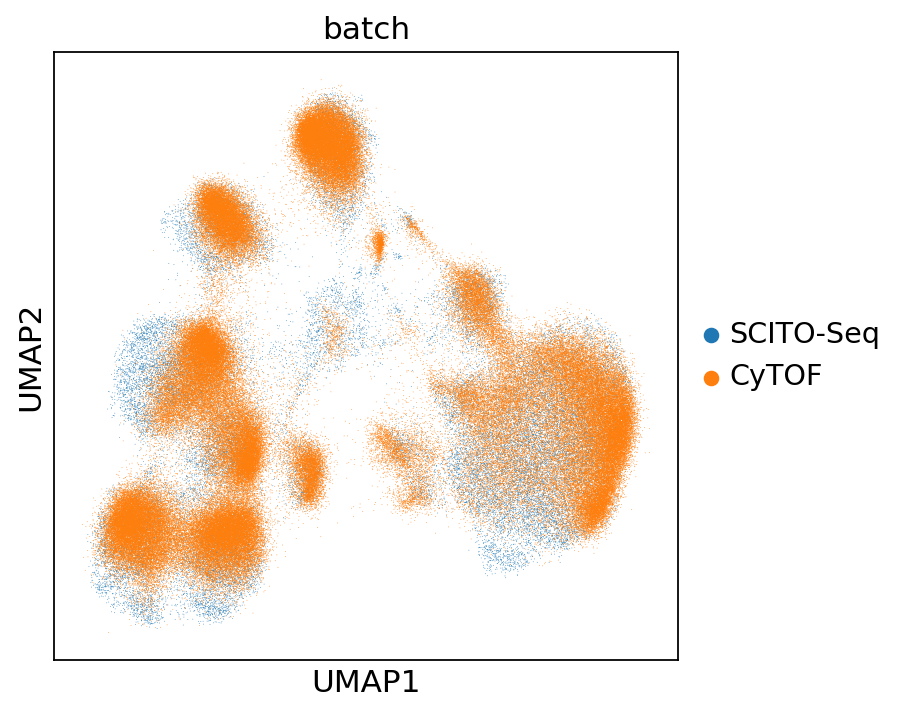

In [362]:
sc.pl.umap(adata_concat,color = ['batch'],save='ingest_scito_cytof_200313.png')

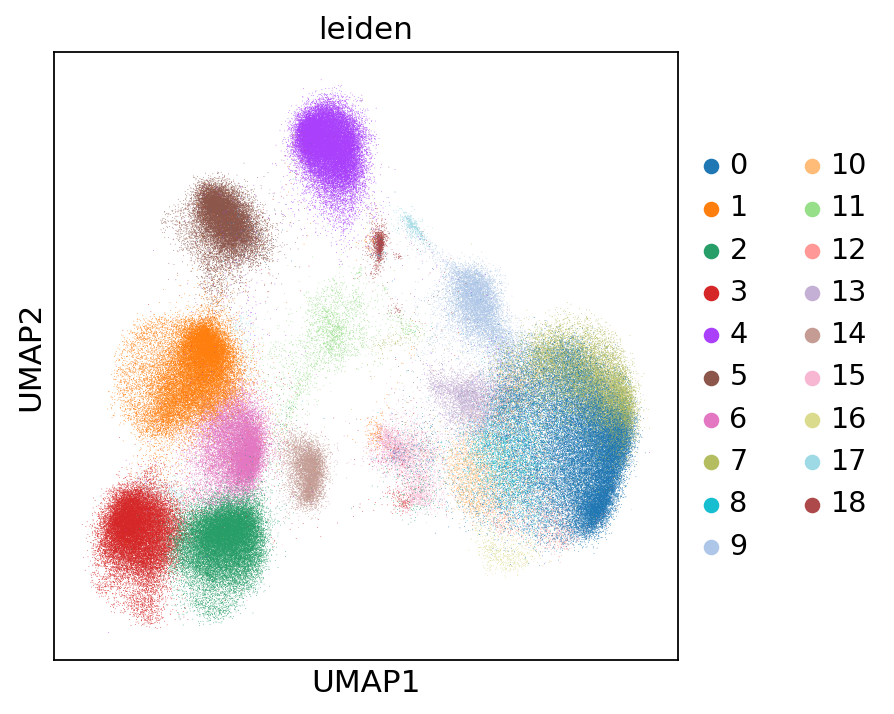

In [363]:
sc.pl.umap(adata_concat,color = ['leiden'],save='ingest_scito_cytof_leiden_200313.png')

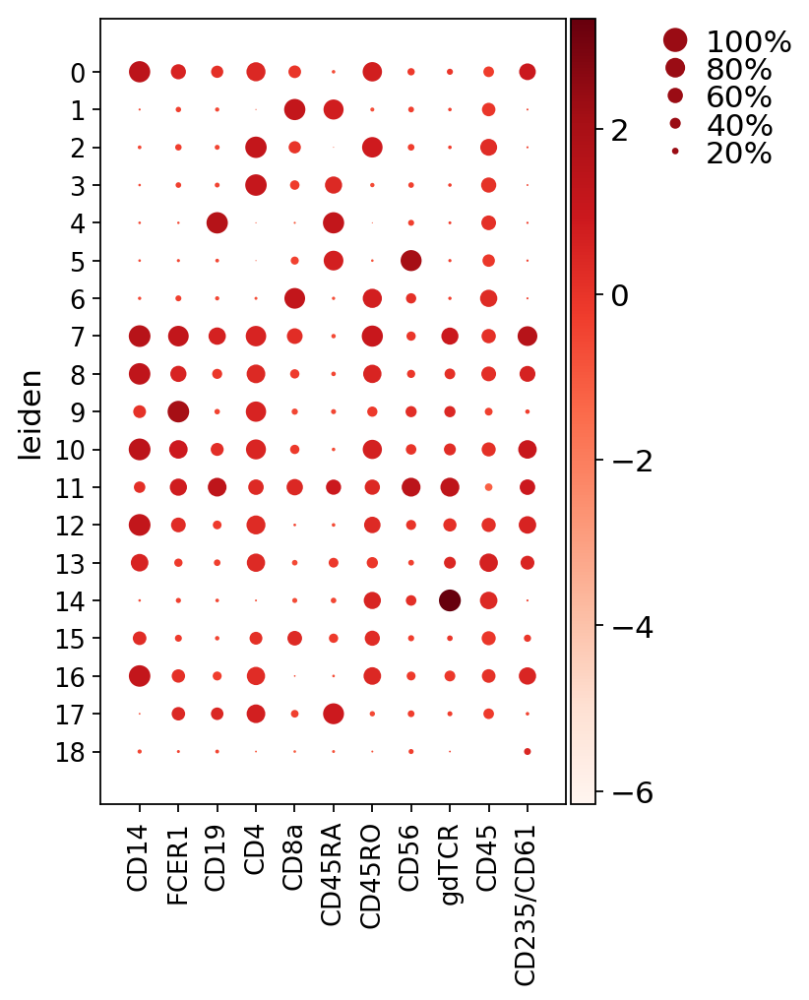

GridSpec(2, 5, height_ratios=[0, 10.5], width_ratios=[3.8499999999999996, 0, 0.2, 0.5, 0.25])

In [347]:
sc.pl.dotplot(adata_concat, groupby = 'leiden', var_names = ['CD14', 'FCER1','CD19','CD4','CD8a', 'CD45RA','CD45RO','CD56','gdTCR','CD45','CD235/CD61'])

#collided = 7,11,16,18

In [234]:
adata_concat.obs

,Batch,DBC,Demuxlet,Reclassify,Type,batch,cell id,donor,leiden,nCount_ADT,nCount_RNA,nFeature_ADT,nFeature_RNA,n_counts,orig.ident,x
AAACCCAAGGCTCTAT.1-0-SCITO-Seq,Batch1,AAACCCAAGGCTCTAT-1,donor1,2.0,Negative,SCITO-Seq,nan,nan,5,872.0,872.0,28.0,28.0,872.0,SeuratProject,nan
AAACCCACAAATCAGA.1-0-SCITO-Seq,Batch1,AAACCCACAAATCAGA-1,donor0,1.0,Negative,SCITO-Seq,nan,nan,5,1083.0,1083.0,24.0,24.0,1083.0,SeuratProject,nan
AAACCCACAACGGGTA.1-0-SCITO-Seq,Batch1,AAACCCACAACGGGTA-1,donor1,NaN,Doublet,SCITO-Seq,nan,nan,3,1460.0,1460.0,25.0,25.0,1460.0,SeuratProject,nan
AAACCCATCTAGAACC.1-0-SCITO-Seq,Batch1,AAACCCATCTAGAACC-1,donor1,NaN,Singlet,SCITO-Seq,nan,nan,15,2375.0,2375.0,27.0,27.0,2375.0,SeuratProject,nan
AAACGAAGTACCACGC.1-0-SCITO-Seq,Batch1,AAACGAAGTACCACGC-1,donor1,NaN,Triplet,SCITO-Seq,nan,nan,15,1217.0,1217.0,26.0,26.0,1217.0,SeuratProject,nan
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
199995-CyTOF,nan,nan,nan,NaN,nan,CyTOF,111062,TMA-003,4,NaN,NaN,NaN,NaN,NaN,nan,26
199996-CyTOF,nan,nan,nan,NaN,nan,CyTOF,183803,TMA-003,4,NaN,NaN,NaN,NaN,NaN,nan,26
199997-CyTOF,nan,nan,nan,NaN,nan,CyTOF,168098,TMA-003,17,NaN,NaN,NaN,NaN,NaN,nan,26
199998-CyTOF,nan,nan,nan,NaN,nan,CyTOF,217888,TMA-003,4,NaN,NaN,NaN,NaN,NaN,nan,26


# Below codes for the figures 

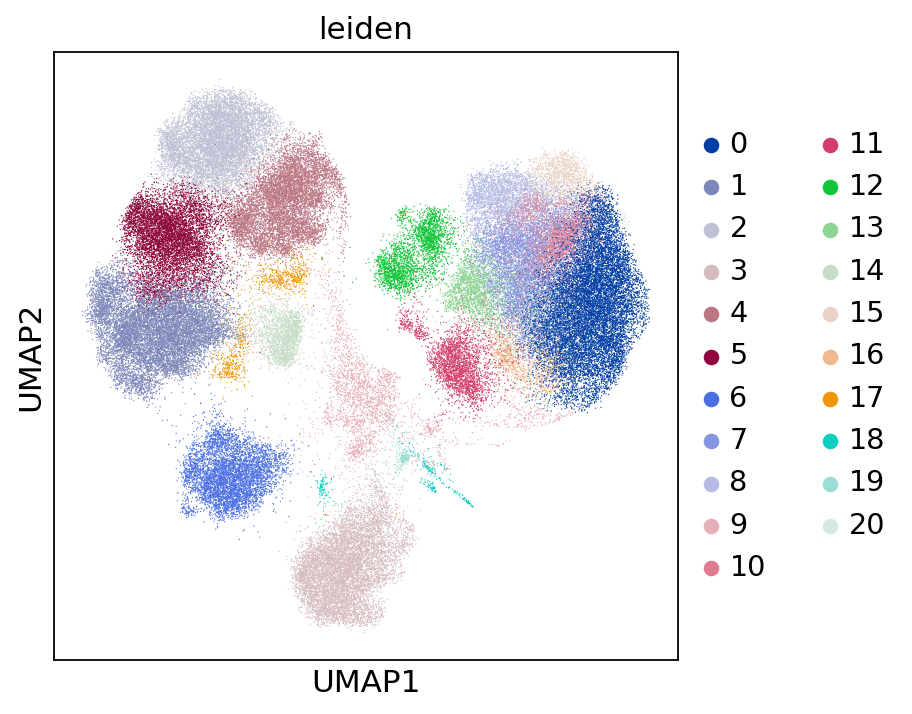

In [344]:
sc.pl.umap(adata_2, color = 'leiden', save = '200313_fig_3b.png')

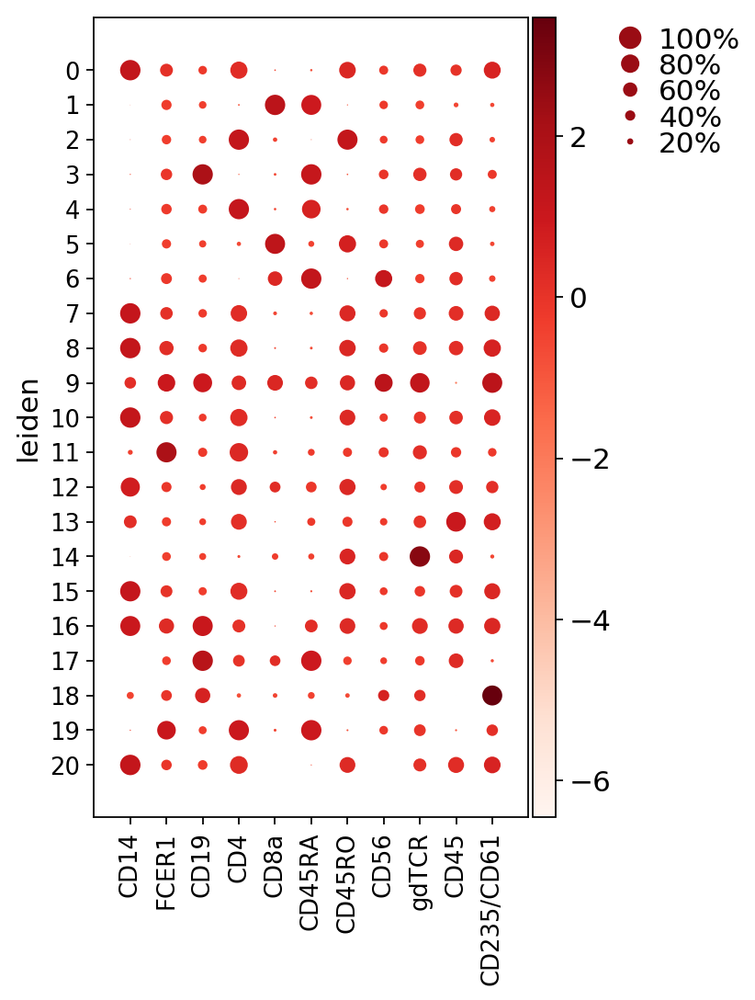

GridSpec(2, 5, height_ratios=[0, 10.5], width_ratios=[3.8499999999999996, 0, 0.2, 0.5, 0.25])

In [348]:
# Inspect which marker is expressed in each leiden cluster
sc.pl.dotplot(adata_2, groupby = 'leiden', var_names = ['CD14', 'FCER1','CD19','CD4','CD8a', 'CD45RA','CD45RO','CD56','gdTCR','CD45','CD235/CD61'])

In [353]:
new_cluster_names = ['Monocytes',
                     'CD8 Naïve T cells',
                     'CD4 Memory T cells',
                     'B cells',
                     'CD4 Naïve T cells',
                     'CD8 Memory T cells',
                     'Natural Killer cells',
                     'Monocytes-2',
                     'Monocytes-3',
                     'Collided cells',
                     'Monocytes-4',
                     'Conventional Dendritic cells',
                     'Collided cells-2',
                     'Monocytes-5',
                     'gd T cells',
                     'Monocytes-6',
                     'Collided cells-3',
                     'Collided cells-4',
                     'RBCs',
                     'Collided cells-5',
                     'Monocytes-7']

adata_2.rename_categories('leiden', new_cluster_names)

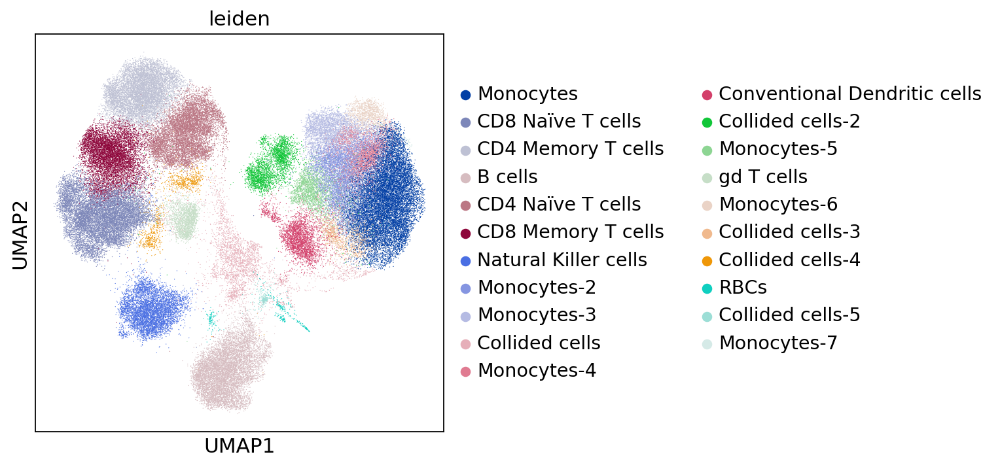

In [355]:
sc.pl.umap(adata_2, color = 'leiden', save = '200313_fig_3b_labelled.png')

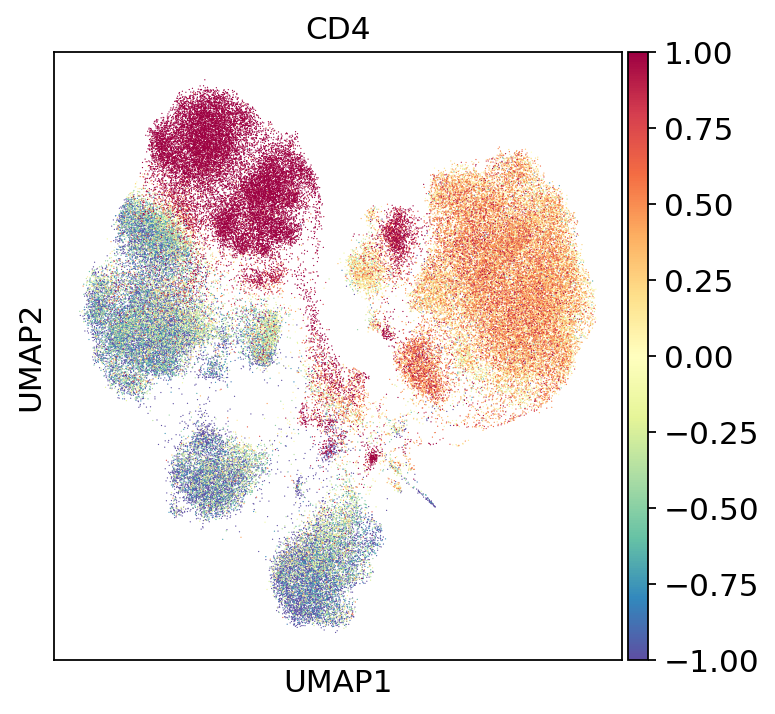

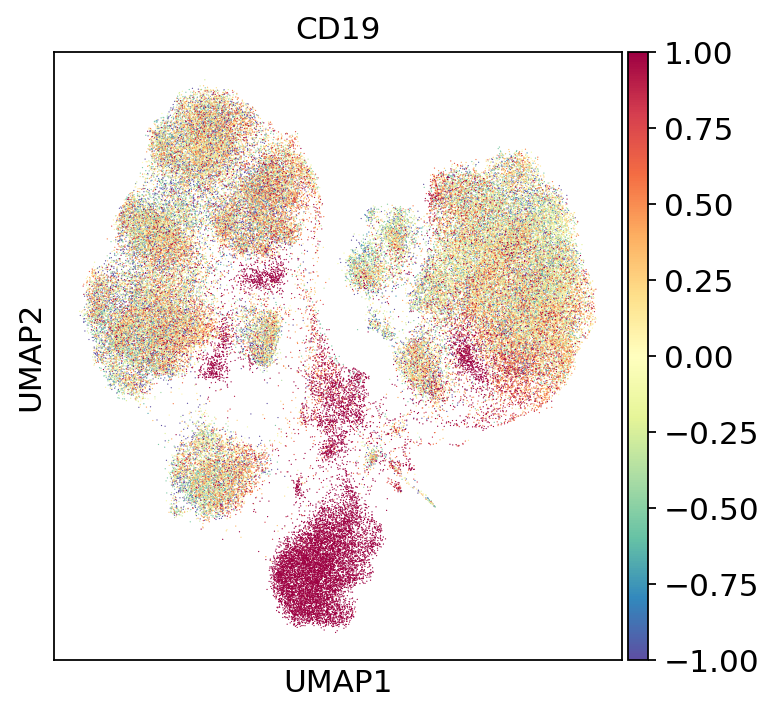

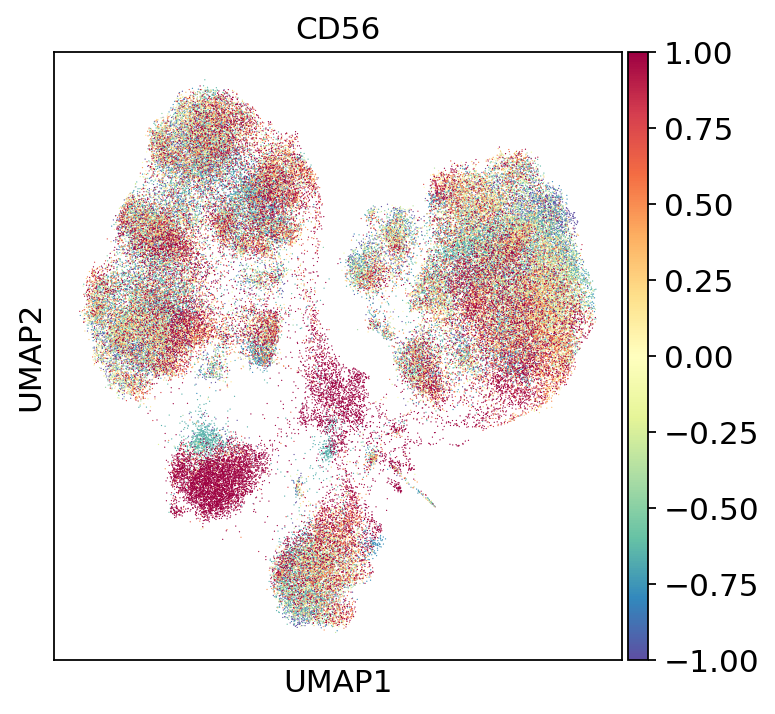

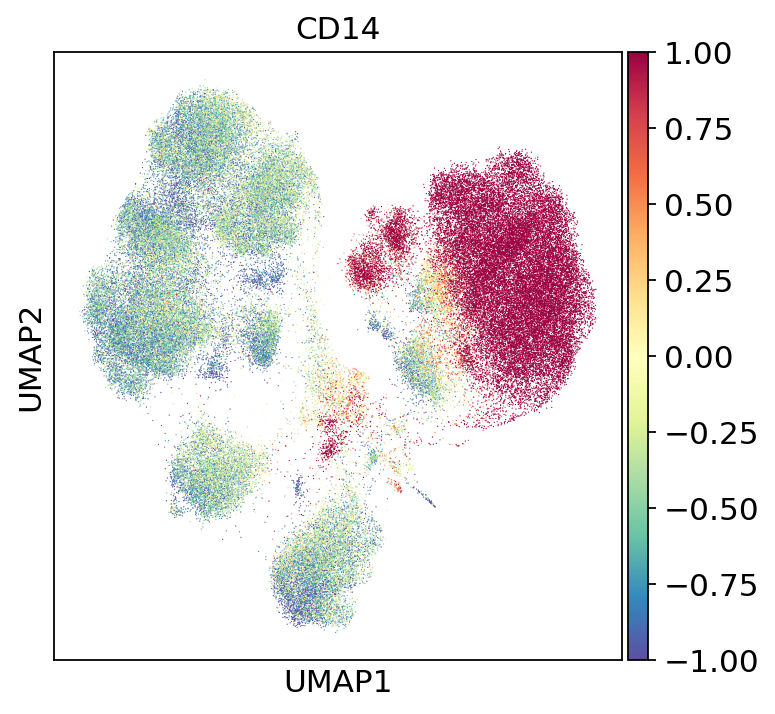

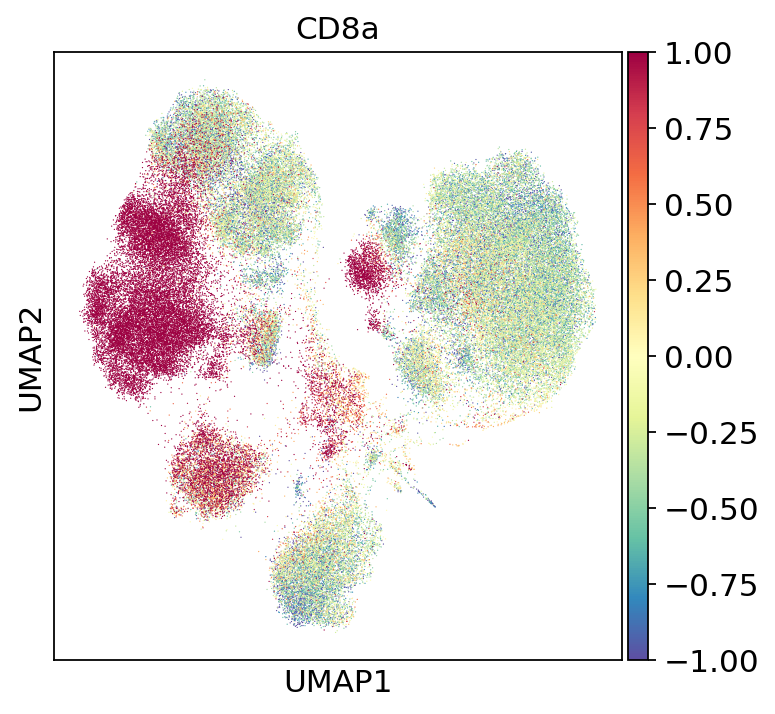

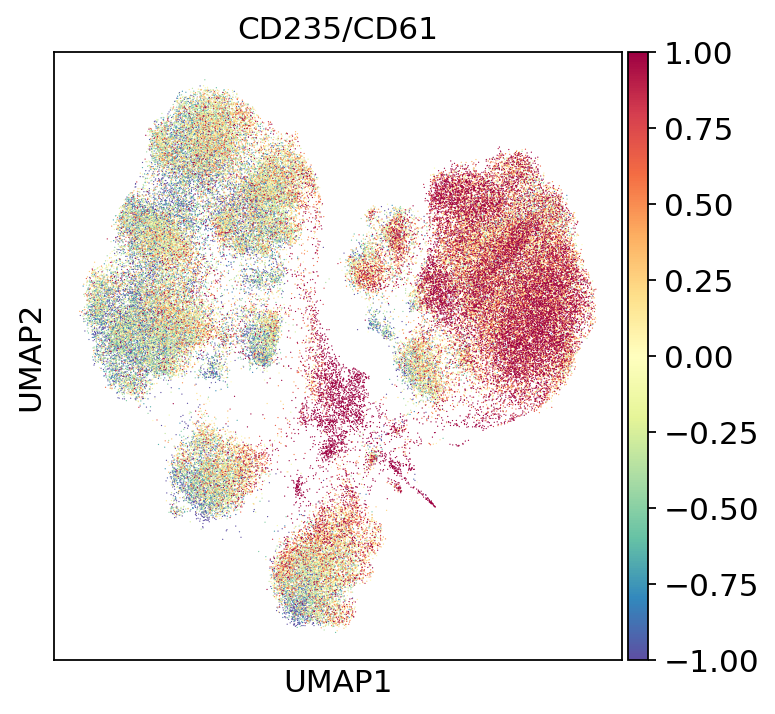

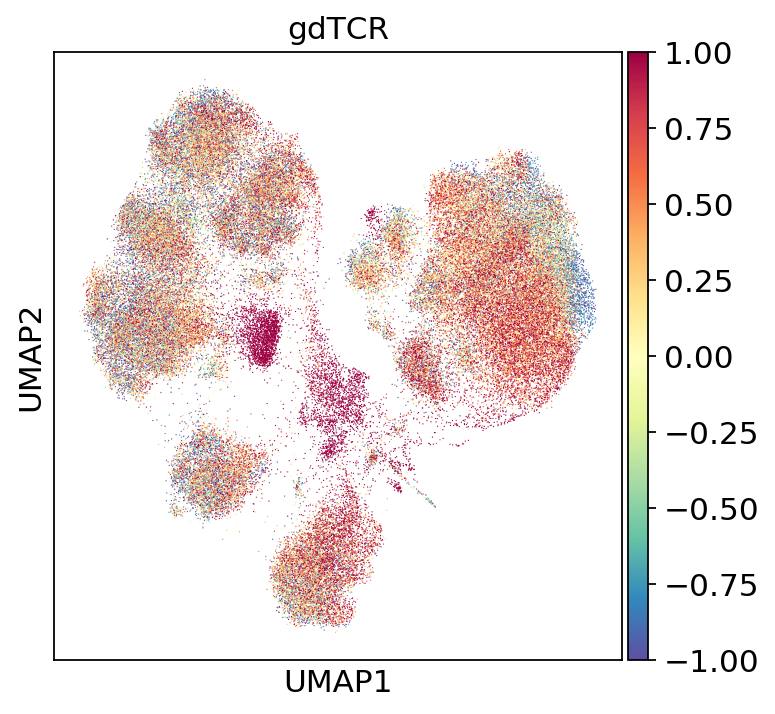

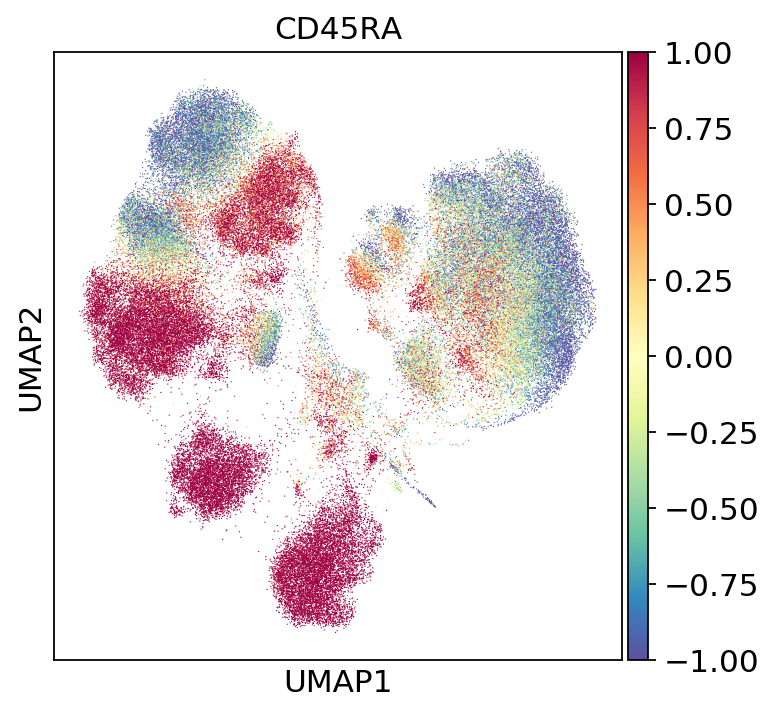

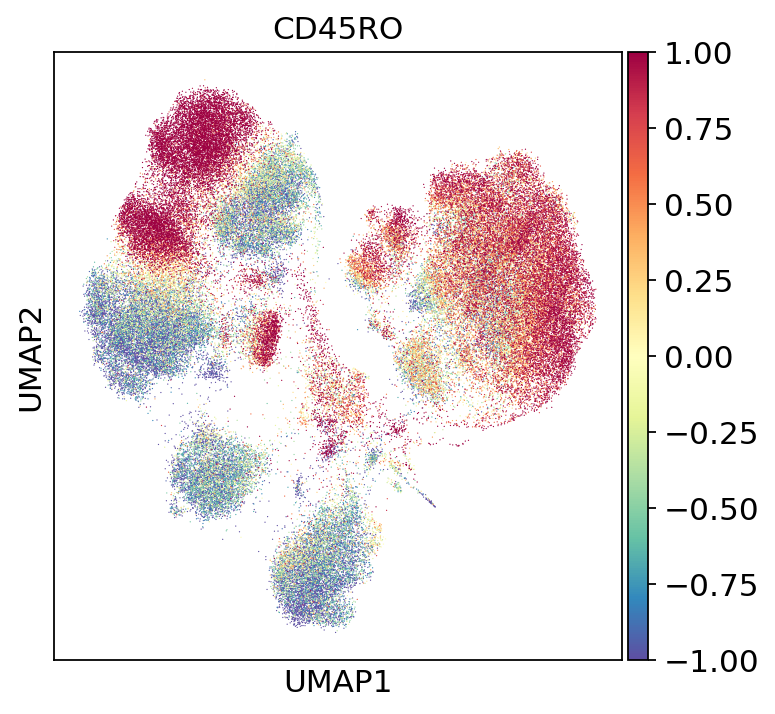

In [357]:
sc.pl.umap(adata_2, color=['CD4'], color_map=mpl.cm.Spectral_r, save="200313_200k_cd4_resolved.png",vmin=-1,vmax=1)
sc.pl.umap(adata_2, color=['CD19'], color_map=mpl.cm.Spectral_r, save="200313_200k_cd19_resolved.png",vmin=-1,vmax=1)
sc.pl.umap(adata_2, color=['CD56'], color_map=mpl.cm.Spectral_r, save="200313_200k_cd56_resolved.png",vmin=-1,vmax=1)
sc.pl.umap(adata_2, color=['CD14'], color_map=mpl.cm.Spectral_r, save="200313_200k_cd14_resolved.png",vmin=-1,vmax=1)
sc.pl.umap(adata_2, color=['CD8a'], color_map=mpl.cm.Spectral_r, save="200313_200k_cd8a_resolved.png",vmin=-1,vmax=1)
sc.pl.umap(adata_2, color=['CD235/CD61'], color_map=mpl.cm.Spectral_r, save="200313_200k_cd235_cd61_resolved.png",vmin=-1,vmax=1)
sc.pl.umap(adata_2, color=['gdTCR'], color_map=mpl.cm.Spectral_r, save="200313_200k_gdTCR_resolved.png",vmin=-1,vmax=1)
sc.pl.umap(adata_2, color=['CD45RA'], color_map=mpl.cm.Spectral_r, save="200313_200k_CD45RA_resolved.png",vmin=-1,vmax=1)
sc.pl.umap(adata_2, color=['CD45RO'], color_map=mpl.cm.Spectral_r, save="200313_200k_CD45RO_resolved.png",vmin=-1,vmax=1)






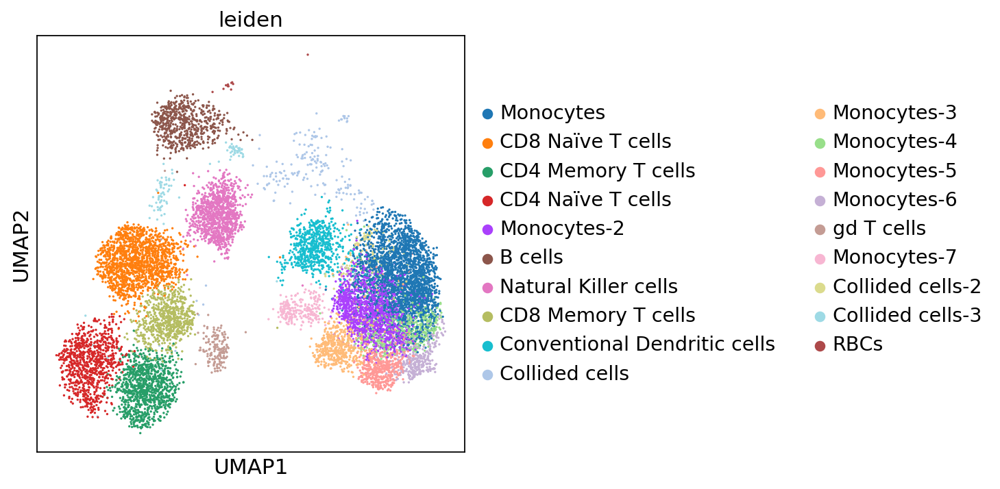

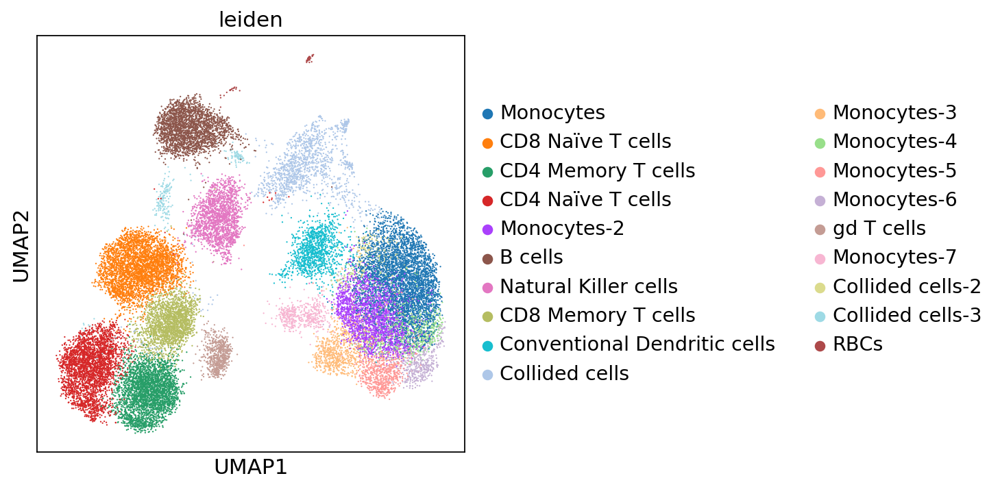

In [48]:
singlets_200k = adata_200k[adata_200k.obs['Type']== 'Singlet']
multiplets_200k = adata_200k[adata_200k.obs['Type']=='Doublet']
sc.pl.umap(singlets_200k,color='leiden', save ='200306_200k_singlets.png')
sc.pl.umap(multiplets_200k,color='leiden',save='200306_200k_multiplets.png')

In [50]:
new_cluster_names = ['0','1','2','3','4','5',
                     '6','7','8','9',
                     '10','11','12','13','14','15',
                     '16','17','18']

adata_200k.rename_categories('leiden', new_cluster_names)

In [21]:
adata_200k.obs

,Batch,DBC,Demuxlet,Type,batch,nCount_ADT,nCount_RNA,nFeature_ADT,nFeature_RNA,n_counts,orig.ident,leiden
AAACCCAAGGCTCTAT.1-0,Batch1,AAACCCAAGGCTCTAT-1,donor1,Singlet,0,872,872,28,28,872.0,SeuratProject,5
AAACCCACAAATCAGA.1-0,Batch1,AAACCCACAAATCAGA-1,donor0,Singlet,0,1083,1083,24,24,1083.0,SeuratProject,5
AAACCCACAACGGGTA.1-0,Batch1,AAACCCACAACGGGTA-1,donor1,Doublet,0,1460,1460,25,25,1460.0,SeuratProject,3
AAACCCACAGAGTCTT.1-0,Batch1,AAACCCACAGAGTCTT-1,donor0,Doublet,0,1069,1069,19,19,1069.0,SeuratProject,3
AAACCCAGTCTGTTAG.1-0,Batch1,AAACCCAGTCTGTTAG-1,donor0,Doublet,0,1049,1049,25,25,1049.0,SeuratProject,1
...,...,...,...,...,...,...,...,...,...,...,...,...
TTTGTTGCACAACGTT.1.2-9,Batch10,TTTGTTGCACAACGTT-1,donor0,Doublet,9,536,536,16,16,536.0,SeuratProject,1
TTTGTTGTCCTTATGT.1-9,Batch10,TTTGTTGTCCTTATGT-1,donor1,Singlet,9,3242,3242,28,28,3242.0,SeuratProject,10
TTTGTTGTCGACACCG.1.1-9,Batch10,TTTGTTGTCGACACCG-1,donor1,Doublet,9,863,863,17,17,863.0,SeuratProject,5
TTTGTTGTCGTGCTCT.1.2-9,Batch10,TTTGTTGTCGTGCTCT-1,donor1,Doublet,9,423,423,20,20,423.0,SeuratProject,7


In [238]:
# subset per donor for cytof data
TMA_001_cytof = adata_concat[(adata_concat.obs['batch']=='CyTOF')&(adata_concat.obs['donor']=='TMA-001')]
TMA_003_cytof = adata_concat[(adata_concat.obs['batch']=='CyTOF')&(adata_concat.obs['donor']=='TMA-003')]

In [239]:
#donor0 200k_all_clusters
c0 = TMA_001_cytof[(TMA_001_cytof.obs['leiden']=='0')].shape[0]/(TMA_001_cytof.obs.shape[0])
c1 = TMA_001_cytof[(TMA_001_cytof.obs['leiden']=='1')].shape[0]/TMA_001_cytof.obs.shape[0]
c2 = TMA_001_cytof[(TMA_001_cytof.obs['leiden']=='2')].shape[0]/TMA_001_cytof.obs.shape[0]
c3 = TMA_001_cytof[(TMA_001_cytof.obs['leiden']=='3')].shape[0]/TMA_001_cytof.obs.shape[0]
c4 = TMA_001_cytof[(TMA_001_cytof.obs['leiden']=='4')].shape[0]/TMA_001_cytof.obs.shape[0]
c5 = TMA_001_cytof[(TMA_001_cytof.obs['leiden']=='5') ].shape[0]/TMA_001_cytof.obs.shape[0]
c6 = TMA_001_cytof[(TMA_001_cytof.obs['leiden']=='6')].shape[0]/TMA_001_cytof.obs.shape[0]
c7 = TMA_001_cytof[(TMA_001_cytof.obs['leiden']=='7')].shape[0]/TMA_001_cytof.obs.shape[0]
c8 = TMA_001_cytof[(TMA_001_cytof.obs['leiden']=='8')].shape[0]/TMA_001_cytof.obs.shape[0]
c9 = TMA_001_cytof[(TMA_001_cytof.obs['leiden']=='9')].shape[0]/TMA_001_cytof.obs.shape[0]
c10 = TMA_001_cytof[(TMA_001_cytof.obs['leiden']=='10')].shape[0]/TMA_001_cytof.obs.shape[0]
c11 = TMA_001_cytof[(TMA_001_cytof.obs['leiden']=='11')].shape[0]/TMA_001_cytof.obs.shape[0]
c12 = TMA_001_cytof[(TMA_001_cytof.obs['leiden']=='12')].shape[0]/TMA_001_cytof.obs.shape[0]
c13 = TMA_001_cytof[(TMA_001_cytof.obs['leiden']=='13')].shape[0]/TMA_001_cytof.obs.shape[0]
c14 = TMA_001_cytof[(TMA_001_cytof.obs['leiden']=='14')].shape[0]/TMA_001_cytof.obs.shape[0]
c15 =TMA_001_cytof[(TMA_001_cytof.obs['leiden']=='15')].shape[0]/TMA_001_cytof.obs.shape[0]
c16 =TMA_001_cytof[(TMA_001_cytof.obs['leiden']=='16')].shape[0]/TMA_001_cytof.obs.shape[0]
c17 =TMA_001_cytof[(TMA_001_cytof.obs['leiden']=='17')].shape[0]/TMA_001_cytof.obs.shape[0]
c18 =TMA_001_cytof[(TMA_001_cytof.obs['leiden']=='18')].shape[0]/TMA_001_cytof.obs.shape[0]



TMA_001_cytof_proportions = [c0,c1,c2,c3,c4,c5,c6,c7,c8,c9,c10,c11,c12,c13,c14,c15,c16,c17,c18]

np.sum(TMA_001_cytof_proportions)




0.9999999999999998

In [240]:
#donor1 200k_all_clusters
c0 = TMA_003_cytof[(TMA_003_cytof.obs['leiden']=='0')].shape[0]/(TMA_003_cytof.obs.shape[0])
c1 = TMA_003_cytof[(TMA_003_cytof.obs['leiden']=='1')].shape[0]/TMA_003_cytof.obs.shape[0]
c2 = TMA_003_cytof[(TMA_003_cytof.obs['leiden']=='2')].shape[0]/TMA_003_cytof.obs.shape[0]
c3 = TMA_003_cytof[(TMA_003_cytof.obs['leiden']=='3')].shape[0]/TMA_003_cytof.obs.shape[0]
c4 = TMA_003_cytof[(TMA_003_cytof.obs['leiden']=='4')].shape[0]/TMA_003_cytof.obs.shape[0]
c5 = TMA_003_cytof[(TMA_003_cytof.obs['leiden']=='5') ].shape[0]/TMA_003_cytof.obs.shape[0]
c6 = TMA_003_cytof[(TMA_003_cytof.obs['leiden']=='6')].shape[0]/TMA_003_cytof.obs.shape[0]
c7 = TMA_003_cytof[(TMA_003_cytof.obs['leiden']=='7')].shape[0]/TMA_003_cytof.obs.shape[0]
c8 = TMA_003_cytof[(TMA_003_cytof.obs['leiden']=='8')].shape[0]/TMA_003_cytof.obs.shape[0]
c9 = TMA_003_cytof[(TMA_003_cytof.obs['leiden']=='9')].shape[0]/TMA_003_cytof.obs.shape[0]
c10 = TMA_003_cytof[(TMA_003_cytof.obs['leiden']=='10')].shape[0]/TMA_003_cytof.obs.shape[0]
c11 = TMA_003_cytof[(TMA_003_cytof.obs['leiden']=='11')].shape[0]/TMA_003_cytof.obs.shape[0]
c12 = TMA_003_cytof[(TMA_003_cytof.obs['leiden']=='12')].shape[0]/TMA_003_cytof.obs.shape[0]
c13 = TMA_003_cytof[(TMA_003_cytof.obs['leiden']=='13')].shape[0]/TMA_003_cytof.obs.shape[0]
c14 = TMA_003_cytof[(TMA_003_cytof.obs['leiden']=='14')].shape[0]/TMA_003_cytof.obs.shape[0]
c15 =TMA_003_cytof[(TMA_003_cytof.obs['leiden']=='15')].shape[0]/TMA_003_cytof.obs.shape[0]
c16 =TMA_003_cytof[(TMA_003_cytof.obs['leiden']=='16')].shape[0]/TMA_003_cytof.obs.shape[0]
c17 =TMA_003_cytof[(TMA_003_cytof.obs['leiden']=='17')].shape[0]/TMA_003_cytof.obs.shape[0]
c18 =TMA_003_cytof[(TMA_003_cytof.obs['leiden']=='18')].shape[0]/TMA_003_cytof.obs.shape[0]


TMA_003_cytof_proportions = [c0,c1,c2,c3,c4,c5,c6,c7,c8,c9,c10,c11,c12,c13,c14,c15,c16,c17,c18]

np.sum(TMA_003_cytof_proportions)





1.0

In [241]:
TMA_001_cytof_proportions

[0.13215,
 0.17323,
 0.08776,
 0.11144,
 0.09263,
 0.1038,
 0.08097,
 0.07704,
 0.00827,
 0.03546,
 0.00958,
 0.00497,
 0.00051,
 0.01264,
 0.04588,
 0.01687,
 1e-05,
 0.0025,
 0.00429]

In [242]:
TMA_003_cytof_proportions

[0.18453,
 0.06476,
 0.13881,
 0.11893,
 0.18217,
 0.05832,
 0.06912,
 0.05435,
 0.01554,
 0.03561,
 0.01333,
 0.00542,
 0.00096,
 0.02354,
 0.01045,
 0.01063,
 1e-05,
 0.00333,
 0.01019]